# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = [False, False],
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=['zone', 'time_cat'],
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v1_1"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/tmp/ipykernel_504091/842258563.py:50: UserWarning: `(None, ['zone', 'time_cat'])` is defined as `batch_key` or `categorical_covariate`, it will be given to both encoder and decoder. Make sure this does not contain information of any of your disentenglement targets. For example, if `donor_id` is chosen as a batch key, do not disentengle donor level information such as `sex` or `age`. The decoder should not use the disentengled latent spaces, simply ignores, if it is already given a batch_key. 
  tardis.MyModel.setup_anndata(adata, **dataset_params)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 87bdrdkz
Name: carbonite-carrier-135
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/87bdrdkz
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_155910-87bdrdkz/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2567,3291,9385
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 638,818,2354
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:09<1:32:10,  9.23s/it]

Epoch 1/600:   0%|          | 1/600 [00:09<1:32:10,  9.23s/it, v_num=kz_1, total_loss_train=3.71e+3, kl_local_train=45.9]

Epoch 2/600:   0%|          | 1/600 [00:09<1:32:10,  9.23s/it, v_num=kz_1, total_loss_train=3.71e+3, kl_local_train=45.9]

Epoch 2/600:   0%|          | 2/600 [00:17<1:25:51,  8.61s/it, v_num=kz_1, total_loss_train=3.71e+3, kl_local_train=45.9]

Epoch 2/600:   0%|          | 2/600 [00:17<1:25:51,  8.61s/it, v_num=kz_1, total_loss_train=3.23e+3, kl_local_train=69.4]

Epoch 3/600:   0%|          | 2/600 [00:17<1:25:51,  8.61s/it, v_num=kz_1, total_loss_train=3.23e+3, kl_local_train=69.4]

Epoch 3/600:   0%|          | 3/600 [00:25<1:25:20,  8.58s/it, v_num=kz_1, total_loss_train=3.23e+3, kl_local_train=69.4]

Epoch 3/600:   0%|          | 3/600 [00:25<1:25:20,  8.58s/it, v_num=kz_1, total_loss_train=3.22e+3, kl_local_train=69.8]

Epoch 4/600:   0%|          | 3/600 [00:25<1:25:20,  8.58s/it, v_num=kz_1, total_loss_train=3.22e+3, kl_local_train=69.8]

Epoch 4/600:   1%|          | 4/600 [00:34<1:25:19,  8.59s/it, v_num=kz_1, total_loss_train=3.22e+3, kl_local_train=69.8]

Epoch 4/600:   1%|          | 4/600 [00:34<1:25:19,  8.59s/it, v_num=kz_1, total_loss_train=3.21e+3, kl_local_train=64.1]

Epoch 5/600:   1%|          | 4/600 [00:34<1:25:19,  8.59s/it, v_num=kz_1, total_loss_train=3.21e+3, kl_local_train=64.1]

Epoch 5/600:   1%|          | 5/600 [00:42<1:23:48,  8.45s/it, v_num=kz_1, total_loss_train=3.21e+3, kl_local_train=64.1]

Epoch 5/600:   1%|          | 5/600 [00:42<1:23:48,  8.45s/it, v_num=kz_1, total_loss_train=3.21e+3, kl_local_train=48.1]

Epoch 6/600:   1%|          | 5/600 [00:43<1:23:48,  8.45s/it, v_num=kz_1, total_loss_train=3.21e+3, kl_local_train=48.1]

Epoch 6/600:   1%|          | 6/600 [00:51<1:25:05,  8.59s/it, v_num=kz_1, total_loss_train=3.21e+3, kl_local_train=48.1]

Epoch 6/600:   1%|          | 6/600 [00:51<1:25:05,  8.59s/it, v_num=kz_1, total_loss_train=3.19e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 7/600:   1%|          | 6/600 [00:51<1:25:05,  8.59s/it, v_num=kz_1, total_loss_train=3.19e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 7/600:   1%|          | 7/600 [00:59<1:22:03,  8.30s/it, v_num=kz_1, total_loss_train=3.19e+3, kl_local_train=45.9, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 7/600:   1%|          | 7/600 [00:59<1:22:03,  8.30s/it, v_num=kz_1, total_loss_train=3.18e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 8/600:   1%|          | 7/600 [00:59<1:22:03,  8.30s/it, v_num=kz_1, total_loss_train=3.18e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 8/600:   1%|▏         | 8/600 [01:07<1:21:20,  8.24s/it, v_num=kz_1, total_loss_train=3.18e+3, kl_local_train=44.6, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 8/600:   1%|▏         | 8/600 [01:07<1:21:20,  8.24s/it, v_num=kz_1, total_loss_train=3.17e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 9/600:   1%|▏         | 8/600 [01:07<1:21:20,  8.24s/it, v_num=kz_1, total_loss_train=3.17e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 9/600:   2%|▏         | 9/600 [01:15<1:20:20,  8.16s/it, v_num=kz_1, total_loss_train=3.17e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 9/600:   2%|▏         | 9/600 [01:15<1:20:20,  8.16s/it, v_num=kz_1, total_loss_train=3.16e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 10/600:   2%|▏         | 9/600 [01:15<1:20:20,  8.16s/it, v_num=kz_1, total_loss_train=3.16e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 10/600:   2%|▏         | 10/600 [01:23<1:20:54,  8.23s/it, v_num=kz_1, total_loss_train=3.16e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 10/600:   2%|▏         | 10/600 [01:23<1:20:54,  8.23s/it, v_num=kz_1, total_loss_train=3.15e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 11/600:   2%|▏         | 10/600 [01:24<1:20:54,  8.23s/it, v_num=kz_1, total_loss_train=3.15e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 11/600:   2%|▏         | 11/600 [01:33<1:23:53,  8.55s/it, v_num=kz_1, total_loss_train=3.15e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0203, metric_mi|zone_train=0.0438, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0371]

Epoch 11/600:   2%|▏         | 11/600 [01:33<1:23:53,  8.55s/it, v_num=kz_1, total_loss_train=3.15e+3, kl_local_train=83.8, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 12/600:   2%|▏         | 11/600 [01:33<1:23:53,  8.55s/it, v_num=kz_1, total_loss_train=3.15e+3, kl_local_train=83.8, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 12/600:   2%|▏         | 12/600 [01:41<1:22:04,  8.37s/it, v_num=kz_1, total_loss_train=3.15e+3, kl_local_train=83.8, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 12/600:   2%|▏         | 12/600 [01:41<1:22:04,  8.37s/it, v_num=kz_1, total_loss_train=3.14e+3, kl_local_train=115, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975] 

Epoch 13/600:   2%|▏         | 12/600 [01:41<1:22:04,  8.37s/it, v_num=kz_1, total_loss_train=3.14e+3, kl_local_train=115, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 13/600:   2%|▏         | 13/600 [01:49<1:21:37,  8.34s/it, v_num=kz_1, total_loss_train=3.14e+3, kl_local_train=115, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 13/600:   2%|▏         | 13/600 [01:49<1:21:37,  8.34s/it, v_num=kz_1, total_loss_train=3.14e+3, kl_local_train=158, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 14/600:   2%|▏         | 13/600 [01:49<1:21:37,  8.34s/it, v_num=kz_1, total_loss_train=3.14e+3, kl_local_train=158, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 14/600:   2%|▏         | 14/600 [01:57<1:19:43,  8.16s/it, v_num=kz_1, total_loss_train=3.14e+3, kl_local_train=158, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 14/600:   2%|▏         | 14/600 [01:57<1:19:43,  8.16s/it, v_num=kz_1, total_loss_train=3.14e+3, kl_local_train=185, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 15/600:   2%|▏         | 14/600 [01:57<1:19:43,  8.16s/it, v_num=kz_1, total_loss_train=3.14e+3, kl_local_train=185, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 15/600:   2%|▎         | 15/600 [02:05<1:19:17,  8.13s/it, v_num=kz_1, total_loss_train=3.14e+3, kl_local_train=185, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 15/600:   2%|▎         | 15/600 [02:05<1:19:17,  8.13s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=168, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 16/600:   2%|▎         | 15/600 [02:06<1:19:17,  8.13s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=168, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 16/600:   3%|▎         | 16/600 [02:13<1:20:15,  8.25s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=168, metric_mi|status_control_train=0.0551, metric_mi|zone_train=0.0693, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0975]

Epoch 16/600:   3%|▎         | 16/600 [02:13<1:20:15,  8.25s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=143, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117] 

Epoch 17/600:   3%|▎         | 16/600 [02:13<1:20:15,  8.25s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=143, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 17/600:   3%|▎         | 17/600 [02:21<1:18:57,  8.13s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=143, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 17/600:   3%|▎         | 17/600 [02:21<1:18:57,  8.13s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=132, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 18/600:   3%|▎         | 17/600 [02:21<1:18:57,  8.13s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=132, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 18/600:   3%|▎         | 18/600 [02:29<1:17:49,  8.02s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=132, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 18/600:   3%|▎         | 18/600 [02:29<1:17:49,  8.02s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=121, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 19/600:   3%|▎         | 18/600 [02:29<1:17:49,  8.02s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=121, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 19/600:   3%|▎         | 19/600 [02:36<1:15:52,  7.83s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=121, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 19/600:   3%|▎         | 19/600 [02:36<1:15:52,  7.83s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=116, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 20/600:   3%|▎         | 19/600 [02:36<1:15:52,  7.83s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=116, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 20/600:   3%|▎         | 20/600 [02:44<1:15:04,  7.77s/it, v_num=kz_1, total_loss_train=3.13e+3, kl_local_train=116, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 20/600:   3%|▎         | 20/600 [02:44<1:15:04,  7.77s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=121, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 21/600:   3%|▎         | 20/600 [02:45<1:15:04,  7.77s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=121, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 21/600:   4%|▎         | 21/600 [02:52<1:17:23,  8.02s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=121, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0559, metric_mi|time_cat_train=0.0933, metric_mi|mouse_train=0.117]

Epoch 21/600:   4%|▎         | 21/600 [02:52<1:17:23,  8.02s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=125, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 22/600:   4%|▎         | 21/600 [02:52<1:17:23,  8.02s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=125, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 22/600:   4%|▎         | 22/600 [03:00<1:16:31,  7.94s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=125, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 22/600:   4%|▎         | 22/600 [03:00<1:16:31,  7.94s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=133, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 23/600:   4%|▎         | 22/600 [03:00<1:16:31,  7.94s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=133, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 23/600:   4%|▍         | 23/600 [03:08<1:14:56,  7.79s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=133, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 23/600:   4%|▍         | 23/600 [03:08<1:14:56,  7.79s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=136, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 24/600:   4%|▍         | 23/600 [03:08<1:14:56,  7.79s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=136, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 24/600:   4%|▍         | 24/600 [03:15<1:14:46,  7.79s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=136, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 24/600:   4%|▍         | 24/600 [03:15<1:14:46,  7.79s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=133, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 25/600:   4%|▍         | 24/600 [03:15<1:14:46,  7.79s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=133, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 25/600:   4%|▍         | 25/600 [03:23<1:14:58,  7.82s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=133, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 25/600:   4%|▍         | 25/600 [03:23<1:14:58,  7.82s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=131, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 26/600:   4%|▍         | 25/600 [03:24<1:14:58,  7.82s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=131, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 26/600:   4%|▍         | 26/600 [03:32<1:16:42,  8.02s/it, v_num=kz_1, total_loss_train=3.12e+3, kl_local_train=131, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.0462, metric_mi|time_cat_train=0.0972, metric_mi|mouse_train=0.121]

Epoch 26/600:   4%|▍         | 26/600 [03:32<1:16:42,  8.02s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=129, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 27/600:   4%|▍         | 26/600 [03:32<1:16:42,  8.02s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=129, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 27/600:   4%|▍         | 27/600 [03:39<1:15:47,  7.94s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=129, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 27/600:   4%|▍         | 27/600 [03:39<1:15:47,  7.94s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=126, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 28/600:   4%|▍         | 27/600 [03:40<1:15:47,  7.94s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=126, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 28/600:   5%|▍         | 28/600 [03:47<1:14:11,  7.78s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=126, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 28/600:   5%|▍         | 28/600 [03:47<1:14:11,  7.78s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=127, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 29/600:   5%|▍         | 28/600 [03:47<1:14:11,  7.78s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=127, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 29/600:   5%|▍         | 29/600 [03:55<1:13:51,  7.76s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=127, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 29/600:   5%|▍         | 29/600 [03:55<1:13:51,  7.76s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 30/600:   5%|▍         | 29/600 [03:55<1:13:51,  7.76s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 30/600:   5%|▌         | 30/600 [04:03<1:14:09,  7.81s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 30/600:   5%|▌         | 30/600 [04:03<1:14:09,  7.81s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=121, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 31/600:   5%|▌         | 30/600 [04:04<1:14:09,  7.81s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=121, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 31/600:   5%|▌         | 31/600 [04:11<1:16:38,  8.08s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=121, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0361, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.124]

Epoch 31/600:   5%|▌         | 31/600 [04:11<1:16:38,  8.08s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=115, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119] 

Epoch 32/600:   5%|▌         | 31/600 [04:11<1:16:38,  8.08s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=115, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 32/600:   5%|▌         | 32/600 [04:19<1:15:17,  7.95s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=115, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 32/600:   5%|▌         | 32/600 [04:19<1:15:17,  7.95s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=115, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 33/600:   5%|▌         | 32/600 [04:19<1:15:17,  7.95s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=115, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 33/600:   6%|▌         | 33/600 [04:26<1:13:55,  7.82s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=115, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 33/600:   6%|▌         | 33/600 [04:26<1:13:55,  7.82s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=109, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 34/600:   6%|▌         | 33/600 [04:26<1:13:55,  7.82s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=109, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 34/600:   6%|▌         | 34/600 [04:34<1:12:45,  7.71s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=109, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 34/600:   6%|▌         | 34/600 [04:34<1:12:45,  7.71s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=110, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 35/600:   6%|▌         | 34/600 [04:34<1:12:45,  7.71s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=110, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 35/600:   6%|▌         | 35/600 [04:42<1:12:43,  7.72s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=110, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 35/600:   6%|▌         | 35/600 [04:42<1:12:43,  7.72s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=106, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 36/600:   6%|▌         | 35/600 [04:43<1:12:43,  7.72s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=106, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 36/600:   6%|▌         | 36/600 [04:50<1:15:19,  8.01s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=106, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0327, metric_mi|time_cat_train=0.0901, metric_mi|mouse_train=0.119]

Epoch 36/600:   6%|▌         | 36/600 [04:50<1:15:19,  8.01s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 37/600:   6%|▌         | 36/600 [04:50<1:15:19,  8.01s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 37/600:   6%|▌         | 37/600 [04:58<1:13:31,  7.84s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 37/600:   6%|▌         | 37/600 [04:58<1:13:31,  7.84s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=103, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 38/600:   6%|▌         | 37/600 [04:58<1:13:31,  7.84s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=103, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 38/600:   6%|▋         | 38/600 [05:06<1:13:11,  7.81s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=103, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 38/600:   6%|▋         | 38/600 [05:06<1:13:11,  7.81s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=104, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 39/600:   6%|▋         | 38/600 [05:06<1:13:11,  7.81s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=104, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 39/600:   6%|▋         | 39/600 [05:13<1:12:00,  7.70s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=104, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 39/600:   6%|▋         | 39/600 [05:13<1:12:00,  7.70s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 40/600:   6%|▋         | 39/600 [05:13<1:12:00,  7.70s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 40/600:   7%|▋         | 40/600 [05:21<1:12:26,  7.76s/it, v_num=kz_1, total_loss_train=3.11e+3, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 40/600:   7%|▋         | 40/600 [05:21<1:12:26,  7.76s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=98.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 41/600:   7%|▋         | 40/600 [05:22<1:12:26,  7.76s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=98.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 41/600:   7%|▋         | 41/600 [05:30<1:15:00,  8.05s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=98.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0952, metric_mi|mouse_train=0.121]

Epoch 41/600:   7%|▋         | 41/600 [05:30<1:15:00,  8.05s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=99.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 42/600:   7%|▋         | 41/600 [05:30<1:15:00,  8.05s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=99.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 42/600:   7%|▋         | 42/600 [05:37<1:13:16,  7.88s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=99.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 42/600:   7%|▋         | 42/600 [05:37<1:13:16,  7.88s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=101, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121] 

Epoch 43/600:   7%|▋         | 42/600 [05:37<1:13:16,  7.88s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=101, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 43/600:   7%|▋         | 43/600 [05:45<1:12:52,  7.85s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=101, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 43/600:   7%|▋         | 43/600 [05:45<1:12:52,  7.85s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=100, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 44/600:   7%|▋         | 43/600 [05:45<1:12:52,  7.85s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=100, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 44/600:   7%|▋         | 44/600 [05:52<1:11:42,  7.74s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=100, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 44/600:   7%|▋         | 44/600 [05:52<1:11:42,  7.74s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=98.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 45/600:   7%|▋         | 44/600 [05:52<1:11:42,  7.74s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=98.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 45/600:   8%|▊         | 45/600 [06:00<1:11:43,  7.75s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=98.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 45/600:   8%|▊         | 45/600 [06:00<1:11:43,  7.75s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=97.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 46/600:   8%|▊         | 45/600 [06:01<1:11:43,  7.75s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=97.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 46/600:   8%|▊         | 46/600 [06:09<1:14:09,  8.03s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=97.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0285, metric_mi|time_cat_train=0.0985, metric_mi|mouse_train=0.121]

Epoch 46/600:   8%|▊         | 46/600 [06:09<1:14:09,  8.03s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=99.2, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117] 

Epoch 47/600:   8%|▊         | 46/600 [06:09<1:14:09,  8.03s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=99.2, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 47/600:   8%|▊         | 47/600 [06:16<1:12:24,  7.86s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=99.2, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 47/600:   8%|▊         | 47/600 [06:16<1:12:24,  7.86s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=97.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 48/600:   8%|▊         | 47/600 [06:16<1:12:24,  7.86s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=97.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 48/600:   8%|▊         | 48/600 [06:24<1:11:59,  7.82s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=97.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 48/600:   8%|▊         | 48/600 [06:24<1:11:59,  7.82s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=97.8, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 49/600:   8%|▊         | 48/600 [06:24<1:11:59,  7.82s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=97.8, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 49/600:   8%|▊         | 49/600 [06:31<1:10:46,  7.71s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=97.8, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 49/600:   8%|▊         | 49/600 [06:31<1:10:46,  7.71s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=95.7, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 50/600:   8%|▊         | 49/600 [06:31<1:10:46,  7.71s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=95.7, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 50/600:   8%|▊         | 50/600 [06:39<1:11:23,  7.79s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=95.7, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 50/600:   8%|▊         | 50/600 [06:39<1:11:23,  7.79s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=96.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 51/600:   8%|▊         | 50/600 [06:40<1:11:23,  7.79s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=96.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 51/600:   8%|▊         | 51/600 [06:48<1:12:47,  7.96s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=96.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0272, metric_mi|time_cat_train=0.092, metric_mi|mouse_train=0.117]

Epoch 51/600:   8%|▊         | 51/600 [06:48<1:12:47,  7.96s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=94, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]  

Epoch 52/600:   8%|▊         | 51/600 [06:48<1:12:47,  7.96s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=94, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 52/600:   9%|▊         | 52/600 [06:55<1:12:06,  7.89s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=94, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 52/600:   9%|▊         | 52/600 [06:55<1:12:06,  7.89s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=95.5, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 53/600:   9%|▊         | 52/600 [06:56<1:12:06,  7.89s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=95.5, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 53/600:   9%|▉         | 53/600 [07:03<1:10:42,  7.76s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=95.5, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 53/600:   9%|▉         | 53/600 [07:03<1:10:42,  7.76s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=94.3, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 54/600:   9%|▉         | 53/600 [07:03<1:10:42,  7.76s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=94.3, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 54/600:   9%|▉         | 54/600 [07:11<1:10:29,  7.75s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=94.3, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 54/600:   9%|▉         | 54/600 [07:11<1:10:29,  7.75s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=94.6, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 55/600:   9%|▉         | 54/600 [07:11<1:10:29,  7.75s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=94.6, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 55/600:   9%|▉         | 55/600 [07:18<1:09:30,  7.65s/it, v_num=kz_1, total_loss_train=3.1e+3, kl_local_train=94.6, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 55/600:   9%|▉         | 55/600 [07:18<1:09:30,  7.65s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=93.1, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 56/600:   9%|▉         | 55/600 [07:19<1:09:30,  7.65s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=93.1, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 56/600:   9%|▉         | 56/600 [07:27<1:12:19,  7.98s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=93.1, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.113]

Epoch 56/600:   9%|▉         | 56/600 [07:27<1:12:19,  7.98s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=93.2, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 57/600:   9%|▉         | 56/600 [07:27<1:12:19,  7.98s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=93.2, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 57/600:  10%|▉         | 57/600 [07:34<1:10:55,  7.84s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=93.2, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 57/600:  10%|▉         | 57/600 [07:34<1:10:55,  7.84s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=93, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]  

Epoch 58/600:  10%|▉         | 57/600 [07:34<1:10:55,  7.84s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=93, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 58/600:  10%|▉         | 58/600 [07:42<1:10:37,  7.82s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=93, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 58/600:  10%|▉         | 58/600 [07:42<1:10:37,  7.82s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=91.9, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 59/600:  10%|▉         | 58/600 [07:42<1:10:37,  7.82s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=91.9, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 59/600:  10%|▉         | 59/600 [07:50<1:10:18,  7.80s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=91.9, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 59/600:  10%|▉         | 59/600 [07:50<1:10:18,  7.80s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=90.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 60/600:  10%|▉         | 59/600 [07:50<1:10:18,  7.80s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=90.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 60/600:  10%|█         | 60/600 [07:58<1:09:50,  7.76s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=90.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 60/600:  10%|█         | 60/600 [07:58<1:09:50,  7.76s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=89.5, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 61/600:  10%|█         | 60/600 [07:58<1:09:50,  7.76s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=89.5, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 61/600:  10%|█         | 61/600 [08:06<1:12:16,  8.05s/it, v_num=kz_1, total_loss_train=3.09e+3, kl_local_train=89.5, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0251, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.11]

Epoch 61/600:  10%|█         | 61/600 [08:06<1:12:16,  8.05s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11] 

Epoch 62/600:  10%|█         | 61/600 [08:06<1:12:16,  8.05s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 62/600:  10%|█         | 62/600 [08:14<1:10:32,  7.87s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 62/600:  10%|█         | 62/600 [08:14<1:10:32,  7.87s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=88.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 63/600:  10%|█         | 62/600 [08:14<1:10:32,  7.87s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=88.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 63/600:  10%|█         | 63/600 [08:21<1:10:13,  7.85s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=88.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 63/600:  10%|█         | 63/600 [08:21<1:10:13,  7.85s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 64/600:  10%|█         | 63/600 [08:21<1:10:13,  7.85s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 64/600:  11%|█         | 64/600 [08:29<1:08:58,  7.72s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 64/600:  11%|█         | 64/600 [08:29<1:08:58,  7.72s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=88.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 65/600:  11%|█         | 64/600 [08:29<1:08:58,  7.72s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=88.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 65/600:  11%|█         | 65/600 [08:37<1:09:29,  7.79s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=88.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 65/600:  11%|█         | 65/600 [08:37<1:09:29,  7.79s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 66/600:  11%|█         | 65/600 [08:38<1:09:29,  7.79s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 66/600:  11%|█         | 66/600 [08:45<1:10:53,  7.97s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0852, metric_mi|mouse_train=0.11]

Epoch 66/600:  11%|█         | 66/600 [08:45<1:10:53,  7.97s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.1, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 67/600:  11%|█         | 66/600 [08:45<1:10:53,  7.97s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.1, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 67/600:  11%|█         | 67/600 [08:53<1:10:18,  7.92s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=87.1, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 67/600:  11%|█         | 67/600 [08:53<1:10:18,  7.92s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=85.5, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 68/600:  11%|█         | 67/600 [08:53<1:10:18,  7.92s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=85.5, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 68/600:  11%|█▏        | 68/600 [09:01<1:09:46,  7.87s/it, v_num=kz_1, total_loss_train=3.08e+3, kl_local_train=85.5, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 68/600:  11%|█▏        | 68/600 [09:01<1:09:46,  7.87s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=84.1, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 69/600:  11%|█▏        | 68/600 [09:01<1:09:46,  7.87s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=84.1, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 69/600:  12%|█▏        | 69/600 [09:08<1:08:39,  7.76s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=84.1, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 69/600:  12%|█▏        | 69/600 [09:08<1:08:39,  7.76s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=83.6, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 70/600:  12%|█▏        | 69/600 [09:08<1:08:39,  7.76s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=83.6, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 70/600:  12%|█▏        | 70/600 [09:17<1:09:44,  7.90s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=83.6, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 70/600:  12%|█▏        | 70/600 [09:17<1:09:44,  7.90s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=84.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 71/600:  12%|█▏        | 70/600 [09:17<1:09:44,  7.90s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=84.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 71/600:  12%|█▏        | 71/600 [09:25<1:11:03,  8.06s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=84.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0242, metric_mi|time_cat_train=0.0913, metric_mi|mouse_train=0.113]

Epoch 71/600:  12%|█▏        | 71/600 [09:25<1:11:03,  8.06s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=83.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108] 

Epoch 72/600:  12%|█▏        | 71/600 [09:25<1:11:03,  8.06s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=83.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 72/600:  12%|█▏        | 72/600 [09:33<1:10:17,  7.99s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=83.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 72/600:  12%|█▏        | 72/600 [09:33<1:10:17,  7.99s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=82.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 73/600:  12%|█▏        | 72/600 [09:33<1:10:17,  7.99s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=82.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 73/600:  12%|█▏        | 73/600 [09:40<1:08:50,  7.84s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=82.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 73/600:  12%|█▏        | 73/600 [09:40<1:08:50,  7.84s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=81.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 74/600:  12%|█▏        | 73/600 [09:40<1:08:50,  7.84s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=81.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 74/600:  12%|█▏        | 74/600 [09:48<1:09:22,  7.91s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=81.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 74/600:  12%|█▏        | 74/600 [09:48<1:09:22,  7.91s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=82.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 75/600:  12%|█▏        | 74/600 [09:48<1:09:22,  7.91s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=82.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 75/600:  12%|█▎        | 75/600 [09:56<1:09:44,  7.97s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=82.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 75/600:  12%|█▎        | 75/600 [09:56<1:09:44,  7.97s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=82.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 76/600:  12%|█▎        | 75/600 [09:57<1:09:44,  7.97s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=82.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 76/600:  13%|█▎        | 76/600 [10:05<1:10:29,  8.07s/it, v_num=kz_1, total_loss_train=3.07e+3, kl_local_train=82.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.108]

Epoch 76/600:  13%|█▎        | 76/600 [10:05<1:10:29,  8.07s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=83, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109] 

Epoch 77/600:  13%|█▎        | 76/600 [10:05<1:10:29,  8.07s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=83, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 77/600:  13%|█▎        | 77/600 [10:13<1:09:29,  7.97s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=83, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 77/600:  13%|█▎        | 77/600 [10:13<1:09:29,  7.97s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=81.3, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 78/600:  13%|█▎        | 77/600 [10:13<1:09:29,  7.97s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=81.3, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 78/600:  13%|█▎        | 78/600 [10:20<1:07:55,  7.81s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=81.3, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 78/600:  13%|█▎        | 78/600 [10:20<1:07:55,  7.81s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.4, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 79/600:  13%|█▎        | 78/600 [10:20<1:07:55,  7.81s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.4, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 79/600:  13%|█▎        | 79/600 [10:28<1:07:28,  7.77s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.4, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 79/600:  13%|█▎        | 79/600 [10:28<1:07:28,  7.77s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.3, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 80/600:  13%|█▎        | 79/600 [10:28<1:07:28,  7.77s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.3, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 80/600:  13%|█▎        | 80/600 [10:35<1:07:30,  7.79s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.3, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 80/600:  13%|█▎        | 80/600 [10:35<1:07:30,  7.79s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=79.8, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 81/600:  13%|█▎        | 80/600 [10:37<1:07:30,  7.79s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=79.8, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 81/600:  14%|█▎        | 81/600 [10:44<1:09:28,  8.03s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=79.8, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.109]

Epoch 81/600:  14%|█▎        | 81/600 [10:44<1:09:28,  8.03s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 82/600:  14%|█▎        | 81/600 [10:44<1:09:28,  8.03s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 82/600:  14%|█▎        | 82/600 [10:52<1:08:29,  7.93s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 82/600:  14%|█▎        | 82/600 [10:52<1:08:29,  7.93s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 83/600:  14%|█▎        | 82/600 [10:52<1:08:29,  7.93s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 83/600:  14%|█▍        | 83/600 [10:59<1:07:02,  7.78s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 83/600:  14%|█▍        | 83/600 [10:59<1:07:02,  7.78s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]  

Epoch 84/600:  14%|█▍        | 83/600 [10:59<1:07:02,  7.78s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 84/600:  14%|█▍        | 84/600 [11:07<1:06:44,  7.76s/it, v_num=kz_1, total_loss_train=3.06e+3, kl_local_train=80, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 84/600:  14%|█▍        | 84/600 [11:07<1:06:44,  7.76s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=79.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 85/600:  14%|█▍        | 84/600 [11:07<1:06:44,  7.76s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=79.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 85/600:  14%|█▍        | 85/600 [11:15<1:06:35,  7.76s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=79.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 85/600:  14%|█▍        | 85/600 [11:15<1:06:35,  7.76s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=79.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 86/600:  14%|█▍        | 85/600 [11:16<1:06:35,  7.76s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=79.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 86/600:  14%|█▍        | 86/600 [11:23<1:08:38,  8.01s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=79.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.103]

Epoch 86/600:  14%|█▍        | 86/600 [11:23<1:08:38,  8.01s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102] 

Epoch 87/600:  14%|█▍        | 86/600 [11:23<1:08:38,  8.01s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 87/600:  14%|█▍        | 87/600 [11:31<1:08:01,  7.96s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 87/600:  14%|█▍        | 87/600 [11:31<1:08:01,  7.96s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 88/600:  14%|█▍        | 87/600 [11:31<1:08:01,  7.96s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 88/600:  15%|█▍        | 88/600 [11:39<1:06:38,  7.81s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 88/600:  15%|█▍        | 88/600 [11:39<1:06:38,  7.81s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=78, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]  

Epoch 89/600:  15%|█▍        | 88/600 [11:39<1:06:38,  7.81s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=78, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 89/600:  15%|█▍        | 89/600 [11:46<1:05:36,  7.70s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=78, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 89/600:  15%|█▍        | 89/600 [11:46<1:05:36,  7.70s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 90/600:  15%|█▍        | 89/600 [11:46<1:05:36,  7.70s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 90/600:  15%|█▌        | 90/600 [11:53<1:03:52,  7.51s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 90/600:  15%|█▌        | 90/600 [11:53<1:03:52,  7.51s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=78.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 91/600:  15%|█▌        | 90/600 [11:54<1:03:52,  7.51s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=78.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 91/600:  15%|█▌        | 91/600 [12:01<1:04:10,  7.57s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=78.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.078, metric_mi|mouse_train=0.102]

Epoch 91/600:  15%|█▌        | 91/600 [12:01<1:04:10,  7.57s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.5, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 92/600:  15%|█▌        | 91/600 [12:01<1:04:10,  7.57s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.5, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 92/600:  15%|█▌        | 92/600 [12:08<1:02:19,  7.36s/it, v_num=kz_1, total_loss_train=3.05e+3, kl_local_train=77.5, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 92/600:  15%|█▌        | 92/600 [12:08<1:02:19,  7.36s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=77.2, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 93/600:  15%|█▌        | 92/600 [12:08<1:02:19,  7.36s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=77.2, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 93/600:  16%|█▌        | 93/600 [12:15<1:01:01,  7.22s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=77.2, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 93/600:  16%|█▌        | 93/600 [12:15<1:01:01,  7.22s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=76.6, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 94/600:  16%|█▌        | 93/600 [12:15<1:01:01,  7.22s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=76.6, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 94/600:  16%|█▌        | 94/600 [12:21<59:47,  7.09s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=76.6, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]  

Epoch 94/600:  16%|█▌        | 94/600 [12:21<59:47,  7.09s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=76.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 95/600:  16%|█▌        | 94/600 [12:21<59:47,  7.09s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=76.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 95/600:  16%|█▌        | 95/600 [12:28<59:32,  7.07s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=76.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 95/600:  16%|█▌        | 95/600 [12:28<59:32,  7.07s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75.6, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 96/600:  16%|█▌        | 95/600 [12:29<59:32,  7.07s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75.6, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 96/600:  16%|█▌        | 96/600 [12:36<1:01:09,  7.28s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75.6, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.105]

Epoch 96/600:  16%|█▌        | 96/600 [12:36<1:01:09,  7.28s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=76.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 97/600:  16%|█▌        | 96/600 [12:36<1:01:09,  7.28s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=76.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 97/600:  16%|█▌        | 97/600 [12:43<59:57,  7.15s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=76.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]  

Epoch 97/600:  16%|█▌        | 97/600 [12:43<59:57,  7.15s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 98/600:  16%|█▌        | 97/600 [12:43<59:57,  7.15s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 98/600:  16%|█▋        | 98/600 [12:50<59:06,  7.07s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 98/600:  16%|█▋        | 98/600 [12:50<59:06,  7.07s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]  

Epoch 99/600:  16%|█▋        | 98/600 [12:50<59:06,  7.07s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 99/600:  16%|█▋        | 99/600 [12:57<58:41,  7.03s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 99/600:  16%|█▋        | 99/600 [12:57<58:41,  7.03s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 100/600:  16%|█▋        | 99/600 [12:57<58:41,  7.03s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 100/600:  17%|█▋        | 100/600 [13:04<58:55,  7.07s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 100/600:  17%|█▋        | 100/600 [13:04<58:55,  7.07s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 101/600:  17%|█▋        | 100/600 [13:05<58:55,  7.07s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 101/600:  17%|█▋        | 101/600 [13:12<1:00:43,  7.30s/it, v_num=kz_1, total_loss_train=3.04e+3, kl_local_train=75.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0202, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.103]

Epoch 101/600:  17%|█▋        | 101/600 [13:12<1:00:43,  7.30s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 102/600:  17%|█▋        | 101/600 [13:12<1:00:43,  7.30s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 102/600:  17%|█▋        | 102/600 [13:19<59:41,  7.19s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]  

Epoch 102/600:  17%|█▋        | 102/600 [13:19<59:41,  7.19s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 103/600:  17%|█▋        | 102/600 [13:19<59:41,  7.19s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 103/600:  17%|█▋        | 103/600 [13:26<58:55,  7.11s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 103/600:  17%|█▋        | 103/600 [13:26<58:55,  7.11s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 104/600:  17%|█▋        | 103/600 [13:26<58:55,  7.11s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 104/600:  17%|█▋        | 104/600 [13:33<58:22,  7.06s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 104/600:  17%|█▋        | 104/600 [13:33<58:22,  7.06s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 105/600:  17%|█▋        | 104/600 [13:33<58:22,  7.06s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 105/600:  18%|█▊        | 105/600 [13:40<57:52,  7.02s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 105/600:  18%|█▊        | 105/600 [13:40<57:52,  7.02s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 106/600:  18%|█▊        | 105/600 [13:40<57:52,  7.02s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 106/600:  18%|█▊        | 106/600 [13:47<59:49,  7.27s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.0756, metric_mi|mouse_train=0.0996]

Epoch 106/600:  18%|█▊        | 106/600 [13:47<59:49,  7.27s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103] 

Epoch 107/600:  18%|█▊        | 106/600 [13:47<59:49,  7.27s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 107/600:  18%|█▊        | 107/600 [13:54<59:02,  7.19s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 107/600:  18%|█▊        | 107/600 [13:54<59:02,  7.19s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 108/600:  18%|█▊        | 107/600 [13:54<59:02,  7.19s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 108/600:  18%|█▊        | 108/600 [14:02<59:35,  7.27s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 108/600:  18%|█▊        | 108/600 [14:02<59:35,  7.27s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 109/600:  18%|█▊        | 108/600 [14:02<59:35,  7.27s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 109/600:  18%|█▊        | 109/600 [14:10<1:00:37,  7.41s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=74.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 109/600:  18%|█▊        | 109/600 [14:10<1:00:37,  7.41s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=72.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 110/600:  18%|█▊        | 109/600 [14:10<1:00:37,  7.41s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=72.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 110/600:  18%|█▊        | 110/600 [14:17<1:01:12,  7.49s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=72.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 110/600:  18%|█▊        | 110/600 [14:17<1:01:12,  7.49s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 111/600:  18%|█▊        | 110/600 [14:18<1:01:12,  7.49s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 111/600:  18%|█▊        | 111/600 [14:26<1:03:46,  7.82s/it, v_num=kz_1, total_loss_train=3.03e+3, kl_local_train=73.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.103]

Epoch 111/600:  18%|█▊        | 111/600 [14:26<1:03:46,  7.82s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=73, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955] 

Epoch 112/600:  18%|█▊        | 111/600 [14:26<1:03:46,  7.82s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=73, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 112/600:  19%|█▊        | 112/600 [14:33<1:02:48,  7.72s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=73, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 112/600:  19%|█▊        | 112/600 [14:33<1:02:48,  7.72s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 113/600:  19%|█▊        | 112/600 [14:33<1:02:48,  7.72s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 113/600:  19%|█▉        | 113/600 [14:41<1:02:38,  7.72s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 113/600:  19%|█▉        | 113/600 [14:41<1:02:38,  7.72s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]  

Epoch 114/600:  19%|█▉        | 113/600 [14:41<1:02:38,  7.72s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 114/600:  19%|█▉        | 114/600 [14:49<1:02:10,  7.68s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 114/600:  19%|█▉        | 114/600 [14:49<1:02:10,  7.68s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 115/600:  19%|█▉        | 114/600 [14:49<1:02:10,  7.68s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 115/600:  19%|█▉        | 115/600 [14:56<1:02:09,  7.69s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 115/600:  19%|█▉        | 115/600 [14:56<1:02:09,  7.69s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 116/600:  19%|█▉        | 115/600 [14:57<1:02:09,  7.69s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 116/600:  19%|█▉        | 116/600 [15:05<1:03:55,  7.93s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0955]

Epoch 116/600:  19%|█▉        | 116/600 [15:05<1:03:55,  7.93s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.3, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 117/600:  19%|█▉        | 116/600 [15:05<1:03:55,  7.93s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.3, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 117/600:  20%|█▉        | 117/600 [15:13<1:03:25,  7.88s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.3, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 117/600:  20%|█▉        | 117/600 [15:13<1:03:25,  7.88s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.1, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 118/600:  20%|█▉        | 117/600 [15:13<1:03:25,  7.88s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.1, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 118/600:  20%|█▉        | 118/600 [15:20<1:02:57,  7.84s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=72.1, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 118/600:  20%|█▉        | 118/600 [15:20<1:02:57,  7.84s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 119/600:  20%|█▉        | 118/600 [15:20<1:02:57,  7.84s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 119/600:  20%|█▉        | 119/600 [15:28<1:02:01,  7.74s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 119/600:  20%|█▉        | 119/600 [15:28<1:02:01,  7.74s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 120/600:  20%|█▉        | 119/600 [15:28<1:02:01,  7.74s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 120/600:  20%|██        | 120/600 [15:36<1:02:41,  7.84s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 120/600:  20%|██        | 120/600 [15:36<1:02:41,  7.84s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.3, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 121/600:  20%|██        | 120/600 [15:37<1:02:41,  7.84s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.3, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 121/600:  20%|██        | 121/600 [15:44<1:03:59,  8.02s/it, v_num=kz_1, total_loss_train=3.02e+3, kl_local_train=71.3, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0781, metric_mi|mouse_train=0.0994]

Epoch 121/600:  20%|██        | 121/600 [15:44<1:03:59,  8.02s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 122/600:  20%|██        | 121/600 [15:44<1:03:59,  8.02s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 122/600:  20%|██        | 122/600 [15:52<1:03:08,  7.93s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 122/600:  20%|██        | 122/600 [15:52<1:03:08,  7.93s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.7, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 123/600:  20%|██        | 122/600 [15:52<1:03:08,  7.93s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.7, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 123/600:  20%|██        | 123/600 [15:59<1:01:52,  7.78s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.7, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 123/600:  20%|██        | 123/600 [15:59<1:01:52,  7.78s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.6, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 124/600:  20%|██        | 123/600 [15:59<1:01:52,  7.78s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.6, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 124/600:  21%|██        | 124/600 [16:07<1:01:36,  7.76s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.6, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 124/600:  21%|██        | 124/600 [16:07<1:01:36,  7.76s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.4, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 125/600:  21%|██        | 124/600 [16:07<1:01:36,  7.76s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.4, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 125/600:  21%|██        | 125/600 [16:15<1:00:42,  7.67s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.4, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 125/600:  21%|██        | 125/600 [16:15<1:00:42,  7.67s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=71.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 126/600:  21%|██        | 125/600 [16:16<1:00:42,  7.67s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=71.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 126/600:  21%|██        | 126/600 [16:23<1:02:55,  7.96s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=71.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0182, metric_mi|time_cat_train=0.0762, metric_mi|mouse_train=0.0977]

Epoch 126/600:  21%|██        | 126/600 [16:23<1:02:55,  7.96s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 127/600:  21%|██        | 126/600 [16:23<1:02:55,  7.96s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 127/600:  21%|██        | 127/600 [16:31<1:01:39,  7.82s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 127/600:  21%|██        | 127/600 [16:31<1:01:39,  7.82s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 128/600:  21%|██        | 127/600 [16:31<1:01:39,  7.82s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 128/600:  21%|██▏       | 128/600 [16:39<1:01:27,  7.81s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 128/600:  21%|██▏       | 128/600 [16:39<1:01:27,  7.81s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=69.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 129/600:  21%|██▏       | 128/600 [16:39<1:01:27,  7.81s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=69.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 129/600:  22%|██▏       | 129/600 [16:46<1:00:42,  7.73s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=69.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 129/600:  22%|██▏       | 129/600 [16:46<1:00:42,  7.73s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 130/600:  22%|██▏       | 129/600 [16:46<1:00:42,  7.73s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 130/600:  22%|██▏       | 130/600 [16:54<1:00:54,  7.78s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=70.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 130/600:  22%|██▏       | 130/600 [16:54<1:00:54,  7.78s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=69.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 131/600:  22%|██▏       | 130/600 [16:55<1:00:54,  7.78s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=69.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 131/600:  22%|██▏       | 131/600 [17:02<1:02:22,  7.98s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=69.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0929]

Epoch 131/600:  22%|██▏       | 131/600 [17:02<1:02:22,  7.98s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=69.1, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 132/600:  22%|██▏       | 131/600 [17:02<1:02:22,  7.98s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=69.1, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 132/600:  22%|██▏       | 132/600 [17:10<1:01:40,  7.91s/it, v_num=kz_1, total_loss_train=3.01e+3, kl_local_train=69.1, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 132/600:  22%|██▏       | 132/600 [17:10<1:01:40,  7.91s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.4, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]   

Epoch 133/600:  22%|██▏       | 132/600 [17:10<1:01:40,  7.91s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.4, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 133/600:  22%|██▏       | 133/600 [17:18<1:00:37,  7.79s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.4, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 133/600:  22%|██▏       | 133/600 [17:18<1:00:37,  7.79s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.8, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 134/600:  22%|██▏       | 133/600 [17:18<1:00:37,  7.79s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.8, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 134/600:  22%|██▏       | 134/600 [17:25<1:00:16,  7.76s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.8, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 134/600:  22%|██▏       | 134/600 [17:25<1:00:16,  7.76s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.5, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 135/600:  22%|██▏       | 134/600 [17:25<1:00:16,  7.76s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.5, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 135/600:  22%|██▎       | 135/600 [17:33<59:23,  7.66s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.5, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]  

Epoch 135/600:  22%|██▎       | 135/600 [17:33<59:23,  7.66s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.2, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 136/600:  22%|██▎       | 135/600 [17:34<59:23,  7.66s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.2, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 136/600:  23%|██▎       | 136/600 [17:41<1:01:26,  7.95s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.2, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.0992]

Epoch 136/600:  23%|██▎       | 136/600 [17:41<1:01:26,  7.95s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978] 

Epoch 137/600:  23%|██▎       | 136/600 [17:41<1:01:26,  7.95s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 137/600:  23%|██▎       | 137/600 [17:49<1:00:41,  7.86s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 137/600:  23%|██▎       | 137/600 [17:49<1:00:41,  7.86s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.8, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 138/600:  23%|██▎       | 137/600 [17:49<1:00:41,  7.86s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.8, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 138/600:  23%|██▎       | 138/600 [17:57<59:36,  7.74s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.8, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]  

Epoch 138/600:  23%|██▎       | 138/600 [17:57<59:36,  7.74s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.8, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 139/600:  23%|██▎       | 138/600 [17:57<59:36,  7.74s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.8, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 139/600:  23%|██▎       | 139/600 [18:04<59:30,  7.74s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.8, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 139/600:  23%|██▎       | 139/600 [18:04<59:30,  7.74s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 140/600:  23%|██▎       | 139/600 [18:04<59:30,  7.74s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 140/600:  23%|██▎       | 140/600 [18:12<59:11,  7.72s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=69.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 140/600:  23%|██▎       | 140/600 [18:12<59:11,  7.72s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.4, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 141/600:  23%|██▎       | 140/600 [18:13<59:11,  7.72s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.4, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 141/600:  24%|██▎       | 141/600 [18:20<1:00:39,  7.93s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.4, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0778, metric_mi|mouse_train=0.0978]

Epoch 141/600:  24%|██▎       | 141/600 [18:20<1:00:39,  7.93s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 142/600:  24%|██▎       | 141/600 [18:20<1:00:39,  7.93s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 142/600:  24%|██▎       | 142/600 [18:28<1:00:04,  7.87s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 142/600:  24%|██▎       | 142/600 [18:28<1:00:04,  7.87s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 143/600:  24%|██▎       | 142/600 [18:28<1:00:04,  7.87s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 143/600:  24%|██▍       | 143/600 [18:36<59:08,  7.76s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]  

Epoch 143/600:  24%|██▍       | 143/600 [18:36<59:08,  7.76s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 144/600:  24%|██▍       | 143/600 [18:36<59:08,  7.76s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 144/600:  24%|██▍       | 144/600 [18:43<58:49,  7.74s/it, v_num=kz_1, total_loss_train=3e+3, kl_local_train=68.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 144/600:  24%|██▍       | 144/600 [18:43<58:49,  7.74s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 145/600:  24%|██▍       | 144/600 [18:43<58:49,  7.74s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 145/600:  24%|██▍       | 145/600 [18:51<58:32,  7.72s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 145/600:  24%|██▍       | 145/600 [18:51<58:32,  7.72s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 146/600:  24%|██▍       | 145/600 [18:52<58:32,  7.72s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 146/600:  24%|██▍       | 146/600 [19:00<1:00:30,  8.00s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0653, metric_mi|mouse_train=0.0901]

Epoch 146/600:  24%|██▍       | 146/600 [19:00<1:00:30,  8.00s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=68.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 147/600:  24%|██▍       | 146/600 [19:00<1:00:30,  8.00s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=68.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 147/600:  24%|██▍       | 147/600 [19:07<59:06,  7.83s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=68.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]  

Epoch 147/600:  24%|██▍       | 147/600 [19:07<59:06,  7.83s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 148/600:  24%|██▍       | 147/600 [19:07<59:06,  7.83s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 148/600:  25%|██▍       | 148/600 [19:15<58:30,  7.77s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 148/600:  25%|██▍       | 148/600 [19:15<58:30,  7.77s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 149/600:  25%|██▍       | 148/600 [19:15<58:30,  7.77s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 149/600:  25%|██▍       | 149/600 [19:22<57:35,  7.66s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 149/600:  25%|██▍       | 149/600 [19:22<57:35,  7.66s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 150/600:  25%|██▍       | 149/600 [19:22<57:35,  7.66s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 150/600:  25%|██▌       | 150/600 [19:30<57:42,  7.70s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 150/600:  25%|██▌       | 150/600 [19:30<57:42,  7.70s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 151/600:  25%|██▌       | 150/600 [19:31<57:42,  7.70s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 151/600:  25%|██▌       | 151/600 [19:38<59:29,  7.95s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.0882]

Epoch 151/600:  25%|██▌       | 151/600 [19:38<59:29,  7.95s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]   

Epoch 152/600:  25%|██▌       | 151/600 [19:38<59:29,  7.95s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 152/600:  25%|██▌       | 152/600 [19:46<58:07,  7.78s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 152/600:  25%|██▌       | 152/600 [19:46<58:07,  7.78s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 153/600:  25%|██▌       | 152/600 [19:46<58:07,  7.78s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 153/600:  26%|██▌       | 153/600 [19:54<57:44,  7.75s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 153/600:  26%|██▌       | 153/600 [19:54<57:44,  7.75s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 154/600:  26%|██▌       | 153/600 [19:54<57:44,  7.75s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 154/600:  26%|██▌       | 154/600 [20:01<57:13,  7.70s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 154/600:  26%|██▌       | 154/600 [20:01<57:13,  7.70s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 155/600:  26%|██▌       | 154/600 [20:01<57:13,  7.70s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 155/600:  26%|██▌       | 155/600 [20:09<57:10,  7.71s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=67.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 155/600:  26%|██▌       | 155/600 [20:09<57:10,  7.71s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 156/600:  26%|██▌       | 155/600 [20:10<57:10,  7.71s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 156/600:  26%|██▌       | 156/600 [20:17<58:59,  7.97s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.079, metric_mi|mouse_train=0.0972]

Epoch 156/600:  26%|██▌       | 156/600 [20:17<58:59,  7.97s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 157/600:  26%|██▌       | 156/600 [20:17<58:59,  7.97s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 157/600:  26%|██▌       | 157/600 [20:25<57:50,  7.83s/it, v_num=kz_1, total_loss_train=2.99e+3, kl_local_train=66.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 157/600:  26%|██▌       | 157/600 [20:25<57:50,  7.83s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 158/600:  26%|██▌       | 157/600 [20:25<57:50,  7.83s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 158/600:  26%|██▋       | 158/600 [20:33<57:23,  7.79s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 158/600:  26%|██▋       | 158/600 [20:33<57:23,  7.79s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 159/600:  26%|██▋       | 158/600 [20:33<57:23,  7.79s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 159/600:  26%|██▋       | 159/600 [20:40<56:36,  7.70s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 159/600:  26%|██▋       | 159/600 [20:40<56:36,  7.70s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=66.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 160/600:  26%|██▋       | 159/600 [20:40<56:36,  7.70s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=66.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 160/600:  27%|██▋       | 160/600 [20:48<56:51,  7.75s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=66.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 160/600:  27%|██▋       | 160/600 [20:48<56:51,  7.75s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=66, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]  

Epoch 161/600:  27%|██▋       | 160/600 [20:49<56:51,  7.75s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=66, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 161/600:  27%|██▋       | 161/600 [20:56<58:22,  7.98s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=66, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0157, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0942]

Epoch 161/600:  27%|██▋       | 161/600 [20:56<58:22,  7.98s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 162/600:  27%|██▋       | 161/600 [20:57<58:22,  7.98s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 162/600:  27%|██▋       | 162/600 [21:04<57:19,  7.85s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 162/600:  27%|██▋       | 162/600 [21:04<57:19,  7.85s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 163/600:  27%|██▋       | 162/600 [21:04<57:19,  7.85s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 163/600:  27%|██▋       | 163/600 [21:12<56:42,  7.79s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 163/600:  27%|██▋       | 163/600 [21:12<56:42,  7.79s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 164/600:  27%|██▋       | 163/600 [21:12<56:42,  7.79s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 164/600:  27%|██▋       | 164/600 [21:19<55:52,  7.69s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 164/600:  27%|██▋       | 164/600 [21:19<55:52,  7.69s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 165/600:  27%|██▋       | 164/600 [21:19<55:52,  7.69s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 165/600:  28%|██▊       | 165/600 [21:27<56:04,  7.74s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 165/600:  28%|██▊       | 165/600 [21:27<56:04,  7.74s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 166/600:  28%|██▊       | 165/600 [21:28<56:04,  7.74s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 166/600:  28%|██▊       | 166/600 [21:35<57:15,  7.92s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0912]

Epoch 166/600:  28%|██▊       | 166/600 [21:35<57:15,  7.92s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.1, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 167/600:  28%|██▊       | 166/600 [21:35<57:15,  7.92s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.1, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 167/600:  28%|██▊       | 167/600 [21:43<56:48,  7.87s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.1, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 167/600:  28%|██▊       | 167/600 [21:43<56:48,  7.87s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 168/600:  28%|██▊       | 167/600 [21:43<56:48,  7.87s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 168/600:  28%|██▊       | 168/600 [21:51<55:47,  7.75s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=65.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 168/600:  28%|██▊       | 168/600 [21:51<55:47,  7.75s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=64.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 169/600:  28%|██▊       | 168/600 [21:51<55:47,  7.75s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=64.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 169/600:  28%|██▊       | 169/600 [21:58<55:31,  7.73s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=64.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 169/600:  28%|██▊       | 169/600 [21:58<55:31,  7.73s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=64.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 170/600:  28%|██▊       | 169/600 [21:58<55:31,  7.73s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=64.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 170/600:  28%|██▊       | 170/600 [22:06<55:06,  7.69s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=64.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 170/600:  28%|██▊       | 170/600 [22:06<55:06,  7.69s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=64.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 171/600:  28%|██▊       | 170/600 [22:07<55:06,  7.69s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=64.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 171/600:  28%|██▊       | 171/600 [22:15<57:04,  7.98s/it, v_num=kz_1, total_loss_train=2.98e+3, kl_local_train=64.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0747, metric_mi|mouse_train=0.0939]

Epoch 171/600:  28%|██▊       | 171/600 [22:15<57:04,  7.98s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.5, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 172/600:  28%|██▊       | 171/600 [22:15<57:04,  7.98s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.5, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 172/600:  29%|██▊       | 172/600 [22:22<56:12,  7.88s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.5, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 172/600:  29%|██▊       | 172/600 [22:22<56:12,  7.88s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.2, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 173/600:  29%|██▊       | 172/600 [22:22<56:12,  7.88s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.2, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 173/600:  29%|██▉       | 173/600 [22:30<55:24,  7.79s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.2, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 173/600:  29%|██▉       | 173/600 [22:30<55:24,  7.79s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 174/600:  29%|██▉       | 173/600 [22:30<55:24,  7.79s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 174/600:  29%|██▉       | 174/600 [22:37<54:57,  7.74s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 174/600:  29%|██▉       | 174/600 [22:37<54:57,  7.74s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.2, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 175/600:  29%|██▉       | 174/600 [22:37<54:57,  7.74s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.2, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 175/600:  29%|██▉       | 175/600 [22:45<54:35,  7.71s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.2, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 175/600:  29%|██▉       | 175/600 [22:45<54:35,  7.71s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]  

Epoch 176/600:  29%|██▉       | 175/600 [22:46<54:35,  7.71s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 176/600:  29%|██▉       | 176/600 [22:54<56:21,  7.97s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0153, metric_mi|time_cat_train=0.0699, metric_mi|mouse_train=0.0909]

Epoch 176/600:  29%|██▉       | 176/600 [22:54<56:21,  7.97s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 177/600:  29%|██▉       | 176/600 [22:54<56:21,  7.97s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 177/600:  30%|██▉       | 177/600 [23:01<55:08,  7.82s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 177/600:  30%|██▉       | 177/600 [23:01<55:08,  7.82s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 178/600:  30%|██▉       | 177/600 [23:01<55:08,  7.82s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 178/600:  30%|██▉       | 178/600 [23:09<54:42,  7.78s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=64.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 178/600:  30%|██▉       | 178/600 [23:09<54:42,  7.78s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 179/600:  30%|██▉       | 178/600 [23:09<54:42,  7.78s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 179/600:  30%|██▉       | 179/600 [23:16<53:56,  7.69s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 179/600:  30%|██▉       | 179/600 [23:16<53:56,  7.69s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 180/600:  30%|██▉       | 179/600 [23:16<53:56,  7.69s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 180/600:  30%|███       | 180/600 [23:24<53:57,  7.71s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 180/600:  30%|███       | 180/600 [23:24<53:57,  7.71s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 181/600:  30%|███       | 180/600 [23:25<53:57,  7.71s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 181/600:  30%|███       | 181/600 [23:33<55:47,  7.99s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0884]

Epoch 181/600:  30%|███       | 181/600 [23:33<55:47,  7.99s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 182/600:  30%|███       | 181/600 [23:33<55:47,  7.99s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 182/600:  30%|███       | 182/600 [23:40<54:31,  7.83s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 182/600:  30%|███       | 182/600 [23:40<54:31,  7.83s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 183/600:  30%|███       | 182/600 [23:40<54:31,  7.83s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 183/600:  30%|███       | 183/600 [23:48<54:04,  7.78s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 183/600:  30%|███       | 183/600 [23:48<54:04,  7.78s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=62.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 184/600:  30%|███       | 183/600 [23:48<54:04,  7.78s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=62.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 184/600:  31%|███       | 184/600 [23:55<53:19,  7.69s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=62.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 184/600:  31%|███       | 184/600 [23:55<53:19,  7.69s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]  

Epoch 185/600:  31%|███       | 184/600 [23:55<53:19,  7.69s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 185/600:  31%|███       | 185/600 [24:03<53:32,  7.74s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 185/600:  31%|███       | 185/600 [24:03<53:32,  7.74s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 186/600:  31%|███       | 185/600 [24:04<53:32,  7.74s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 186/600:  31%|███       | 186/600 [24:11<54:49,  7.95s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=63.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.0878]

Epoch 186/600:  31%|███       | 186/600 [24:11<54:49,  7.95s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=62.9, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 187/600:  31%|███       | 186/600 [24:11<54:49,  7.95s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=62.9, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 187/600:  31%|███       | 187/600 [24:19<54:21,  7.90s/it, v_num=kz_1, total_loss_train=2.97e+3, kl_local_train=62.9, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 187/600:  31%|███       | 187/600 [24:19<54:21,  7.90s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=63, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]  

Epoch 188/600:  31%|███       | 187/600 [24:19<54:21,  7.90s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=63, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 188/600:  31%|███▏      | 188/600 [24:27<53:21,  7.77s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=63, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 188/600:  31%|███▏      | 188/600 [24:27<53:21,  7.77s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.7, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 189/600:  31%|███▏      | 188/600 [24:27<53:21,  7.77s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.7, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 189/600:  32%|███▏      | 189/600 [24:35<53:15,  7.78s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.7, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 189/600:  32%|███▏      | 189/600 [24:35<53:15,  7.78s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.5, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 190/600:  32%|███▏      | 189/600 [24:35<53:15,  7.78s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.5, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 190/600:  32%|███▏      | 190/600 [24:42<53:26,  7.82s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.5, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 190/600:  32%|███▏      | 190/600 [24:42<53:26,  7.82s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.9, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 191/600:  32%|███▏      | 190/600 [24:43<53:26,  7.82s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.9, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 191/600:  32%|███▏      | 191/600 [24:51<55:06,  8.08s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.9, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0938]

Epoch 191/600:  32%|███▏      | 191/600 [24:51<55:06,  8.08s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 192/600:  32%|███▏      | 191/600 [24:51<55:06,  8.08s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 192/600:  32%|███▏      | 192/600 [24:59<54:39,  8.04s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 192/600:  32%|███▏      | 192/600 [24:59<54:39,  8.04s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 193/600:  32%|███▏      | 192/600 [24:59<54:39,  8.04s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 193/600:  32%|███▏      | 193/600 [25:07<53:19,  7.86s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 193/600:  32%|███▏      | 193/600 [25:07<53:19,  7.86s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 194/600:  32%|███▏      | 193/600 [25:07<53:19,  7.86s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 194/600:  32%|███▏      | 194/600 [25:14<52:57,  7.83s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 194/600:  32%|███▏      | 194/600 [25:14<52:57,  7.83s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 195/600:  32%|███▏      | 194/600 [25:14<52:57,  7.83s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 195/600:  32%|███▎      | 195/600 [25:22<52:19,  7.75s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 195/600:  32%|███▎      | 195/600 [25:22<52:19,  7.75s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 196/600:  32%|███▎      | 195/600 [25:23<52:19,  7.75s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 196/600:  33%|███▎      | 196/600 [25:30<53:54,  8.01s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0891]

Epoch 196/600:  33%|███▎      | 196/600 [25:30<53:54,  8.01s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]  

Epoch 197/600:  33%|███▎      | 196/600 [25:30<53:54,  8.01s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 197/600:  33%|███▎      | 197/600 [25:38<53:19,  7.94s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 197/600:  33%|███▎      | 197/600 [25:38<53:19,  7.94s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 198/600:  33%|███▎      | 197/600 [25:38<53:19,  7.94s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 198/600:  33%|███▎      | 198/600 [25:46<52:13,  7.79s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=62, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 198/600:  33%|███▎      | 198/600 [25:46<52:13,  7.79s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 199/600:  33%|███▎      | 198/600 [25:46<52:13,  7.79s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 199/600:  33%|███▎      | 199/600 [25:54<52:09,  7.80s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 199/600:  33%|███▎      | 199/600 [25:54<52:09,  7.80s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 200/600:  33%|███▎      | 199/600 [25:54<52:09,  7.80s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 200/600:  33%|███▎      | 200/600 [26:01<51:36,  7.74s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 200/600:  33%|███▎      | 200/600 [26:01<51:36,  7.74s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 201/600:  33%|███▎      | 200/600 [26:02<51:36,  7.74s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 201/600:  34%|███▎      | 201/600 [26:10<53:17,  8.01s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0147, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0922]

Epoch 201/600:  34%|███▎      | 201/600 [26:10<53:17,  8.01s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 202/600:  34%|███▎      | 201/600 [26:10<53:17,  8.01s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 202/600:  34%|███▎      | 202/600 [26:18<52:42,  7.95s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 202/600:  34%|███▎      | 202/600 [26:18<52:42,  7.95s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 203/600:  34%|███▎      | 202/600 [26:18<52:42,  7.95s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 203/600:  34%|███▍      | 203/600 [26:25<51:34,  7.79s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 203/600:  34%|███▍      | 203/600 [26:25<51:34,  7.79s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]  

Epoch 204/600:  34%|███▍      | 203/600 [26:25<51:34,  7.79s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 204/600:  34%|███▍      | 204/600 [26:33<51:22,  7.78s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 204/600:  34%|███▍      | 204/600 [26:33<51:22,  7.78s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 205/600:  34%|███▍      | 204/600 [26:33<51:22,  7.78s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 205/600:  34%|███▍      | 205/600 [26:40<50:26,  7.66s/it, v_num=kz_1, total_loss_train=2.96e+3, kl_local_train=61.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 205/600:  34%|███▍      | 205/600 [26:40<50:26,  7.66s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 206/600:  34%|███▍      | 205/600 [26:41<50:26,  7.66s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 206/600:  34%|███▍      | 206/600 [26:49<52:23,  7.98s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0702, metric_mi|mouse_train=0.0895]

Epoch 206/600:  34%|███▍      | 206/600 [26:49<52:23,  7.98s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 207/600:  34%|███▍      | 206/600 [26:49<52:23,  7.98s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 207/600:  34%|███▍      | 207/600 [26:57<51:55,  7.93s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 207/600:  34%|███▍      | 207/600 [26:57<51:55,  7.93s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 208/600:  34%|███▍      | 207/600 [26:57<51:55,  7.93s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 208/600:  35%|███▍      | 208/600 [27:04<50:44,  7.77s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 208/600:  35%|███▍      | 208/600 [27:04<50:44,  7.77s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]  

Epoch 209/600:  35%|███▍      | 208/600 [27:04<50:44,  7.77s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 209/600:  35%|███▍      | 209/600 [27:12<50:44,  7.79s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=61, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 209/600:  35%|███▍      | 209/600 [27:12<50:44,  7.79s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 210/600:  35%|███▍      | 209/600 [27:12<50:44,  7.79s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 210/600:  35%|███▌      | 210/600 [27:19<49:48,  7.66s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 210/600:  35%|███▌      | 210/600 [27:19<49:48,  7.66s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 211/600:  35%|███▌      | 210/600 [27:20<49:48,  7.66s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 211/600:  35%|███▌      | 211/600 [27:28<51:42,  7.98s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0849]

Epoch 211/600:  35%|███▌      | 211/600 [27:28<51:42,  7.98s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.9, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906] 

Epoch 212/600:  35%|███▌      | 211/600 [27:28<51:42,  7.98s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.9, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 212/600:  35%|███▌      | 212/600 [27:35<50:31,  7.81s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.9, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 212/600:  35%|███▌      | 212/600 [27:35<50:31,  7.81s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 213/600:  35%|███▌      | 212/600 [27:35<50:31,  7.81s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 213/600:  36%|███▌      | 213/600 [27:43<50:32,  7.84s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 213/600:  36%|███▌      | 213/600 [27:43<50:32,  7.84s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 214/600:  36%|███▌      | 213/600 [27:43<50:32,  7.84s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 214/600:  36%|███▌      | 214/600 [27:51<50:25,  7.84s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 214/600:  36%|███▌      | 214/600 [27:51<50:25,  7.84s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.5, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 215/600:  36%|███▌      | 214/600 [27:51<50:25,  7.84s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.5, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 215/600:  36%|███▌      | 215/600 [27:59<49:31,  7.72s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.5, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 215/600:  36%|███▌      | 215/600 [27:59<49:31,  7.72s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 216/600:  36%|███▌      | 215/600 [28:00<49:31,  7.72s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 216/600:  36%|███▌      | 216/600 [28:07<51:21,  8.02s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0906]

Epoch 216/600:  36%|███▌      | 216/600 [28:07<51:21,  8.02s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 217/600:  36%|███▌      | 216/600 [28:07<51:21,  8.02s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 217/600:  36%|███▌      | 217/600 [28:15<50:08,  7.86s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 217/600:  36%|███▌      | 217/600 [28:15<50:08,  7.86s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 218/600:  36%|███▌      | 217/600 [28:15<50:08,  7.86s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 218/600:  36%|███▋      | 218/600 [28:23<49:59,  7.85s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 218/600:  36%|███▋      | 218/600 [28:23<49:59,  7.85s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 219/600:  36%|███▋      | 218/600 [28:23<49:59,  7.85s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 219/600:  36%|███▋      | 219/600 [28:30<49:00,  7.72s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 219/600:  36%|███▋      | 219/600 [28:30<49:00,  7.72s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 220/600:  36%|███▋      | 219/600 [28:30<49:00,  7.72s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 220/600:  37%|███▋      | 220/600 [28:38<49:25,  7.80s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 220/600:  37%|███▋      | 220/600 [28:38<49:25,  7.80s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 221/600:  37%|███▋      | 220/600 [28:39<49:25,  7.80s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 221/600:  37%|███▋      | 221/600 [28:46<50:16,  7.96s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.0656, metric_mi|mouse_train=0.086]

Epoch 221/600:  37%|███▋      | 221/600 [28:46<50:16,  7.96s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=59.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 222/600:  37%|███▋      | 221/600 [28:46<50:16,  7.96s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=59.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 222/600:  37%|███▋      | 222/600 [28:54<49:47,  7.90s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=59.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 222/600:  37%|███▋      | 222/600 [28:54<49:47,  7.90s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 223/600:  37%|███▋      | 222/600 [28:54<49:47,  7.90s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 223/600:  37%|███▋      | 223/600 [29:02<49:34,  7.89s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 223/600:  37%|███▋      | 223/600 [29:02<49:34,  7.89s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=59.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 224/600:  37%|███▋      | 223/600 [29:02<49:34,  7.89s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=59.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 224/600:  37%|███▋      | 224/600 [29:09<48:30,  7.74s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=59.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 224/600:  37%|███▋      | 224/600 [29:09<48:30,  7.74s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=59.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 225/600:  37%|███▋      | 224/600 [29:09<48:30,  7.74s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=59.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 225/600:  38%|███▊      | 225/600 [29:17<48:46,  7.80s/it, v_num=kz_1, total_loss_train=2.95e+3, kl_local_train=59.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 225/600:  38%|███▊      | 225/600 [29:17<48:46,  7.80s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 226/600:  38%|███▊      | 225/600 [29:18<48:46,  7.80s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 226/600:  38%|███▊      | 226/600 [29:26<49:44,  7.98s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.0821]

Epoch 226/600:  38%|███▊      | 226/600 [29:26<49:44,  7.98s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.2, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894] 

Epoch 227/600:  38%|███▊      | 226/600 [29:26<49:44,  7.98s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.2, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 227/600:  38%|███▊      | 227/600 [29:34<49:29,  7.96s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.2, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 227/600:  38%|███▊      | 227/600 [29:34<49:29,  7.96s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.5, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 228/600:  38%|███▊      | 227/600 [29:34<49:29,  7.96s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.5, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 228/600:  38%|███▊      | 228/600 [29:41<48:21,  7.80s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.5, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 228/600:  38%|███▊      | 228/600 [29:41<48:21,  7.80s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 229/600:  38%|███▊      | 228/600 [29:41<48:21,  7.80s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 229/600:  38%|███▊      | 229/600 [29:49<48:23,  7.83s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 229/600:  38%|███▊      | 229/600 [29:49<48:23,  7.83s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.2, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 230/600:  38%|███▊      | 229/600 [29:49<48:23,  7.83s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.2, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 230/600:  38%|███▊      | 230/600 [29:56<47:43,  7.74s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.2, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 230/600:  38%|███▊      | 230/600 [29:56<47:43,  7.74s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 231/600:  38%|███▊      | 230/600 [29:57<47:43,  7.74s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 231/600:  38%|███▊      | 231/600 [30:05<49:44,  8.09s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.072, metric_mi|mouse_train=0.0894]

Epoch 231/600:  38%|███▊      | 231/600 [30:05<49:44,  8.09s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 232/600:  38%|███▊      | 231/600 [30:05<49:44,  8.09s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 232/600:  39%|███▊      | 232/600 [30:13<49:27,  8.06s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 232/600:  39%|███▊      | 232/600 [30:13<49:27,  8.06s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.3, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 233/600:  39%|███▊      | 232/600 [30:13<49:27,  8.06s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.3, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 233/600:  39%|███▉      | 233/600 [30:21<48:03,  7.86s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.3, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 233/600:  39%|███▉      | 233/600 [30:21<48:03,  7.86s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 234/600:  39%|███▉      | 233/600 [30:21<48:03,  7.86s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 234/600:  39%|███▉      | 234/600 [30:28<47:40,  7.82s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 234/600:  39%|███▉      | 234/600 [30:28<47:40,  7.82s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 235/600:  39%|███▉      | 234/600 [30:29<47:40,  7.82s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 235/600:  39%|███▉      | 235/600 [30:36<46:54,  7.71s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 235/600:  39%|███▉      | 235/600 [30:36<46:54,  7.71s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 236/600:  39%|███▉      | 235/600 [30:37<46:54,  7.71s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 236/600:  39%|███▉      | 236/600 [30:45<48:35,  8.01s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0772, metric_mi|mouse_train=0.0918]

Epoch 236/600:  39%|███▉      | 236/600 [30:45<48:35,  8.01s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 237/600:  39%|███▉      | 236/600 [30:45<48:35,  8.01s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 237/600:  40%|███▉      | 237/600 [30:52<47:17,  7.82s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=59.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 237/600:  40%|███▉      | 237/600 [30:52<47:17,  7.82s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 238/600:  40%|███▉      | 237/600 [30:52<47:17,  7.82s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 238/600:  40%|███▉      | 238/600 [31:00<46:59,  7.79s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 238/600:  40%|███▉      | 238/600 [31:00<46:59,  7.79s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 239/600:  40%|███▉      | 238/600 [31:00<46:59,  7.79s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 239/600:  40%|███▉      | 239/600 [31:07<46:08,  7.67s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 239/600:  40%|███▉      | 239/600 [31:07<46:08,  7.67s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 240/600:  40%|███▉      | 239/600 [31:07<46:08,  7.67s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 240/600:  40%|████      | 240/600 [31:15<47:12,  7.87s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 240/600:  40%|████      | 240/600 [31:15<47:12,  7.87s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 241/600:  40%|████      | 240/600 [31:16<47:12,  7.87s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 241/600:  40%|████      | 241/600 [31:24<47:54,  8.01s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0862]

Epoch 241/600:  40%|████      | 241/600 [31:24<47:54,  8.01s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 242/600:  40%|████      | 241/600 [31:24<47:54,  8.01s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 242/600:  40%|████      | 242/600 [31:32<47:24,  7.94s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 242/600:  40%|████      | 242/600 [31:32<47:24,  7.94s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 243/600:  40%|████      | 242/600 [31:32<47:24,  7.94s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 243/600:  40%|████      | 243/600 [31:39<46:18,  7.78s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 243/600:  40%|████      | 243/600 [31:39<46:18,  7.78s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 244/600:  40%|████      | 243/600 [31:39<46:18,  7.78s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 244/600:  41%|████      | 244/600 [31:47<45:56,  7.74s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 244/600:  41%|████      | 244/600 [31:47<45:56,  7.74s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 245/600:  41%|████      | 244/600 [31:47<45:56,  7.74s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 245/600:  41%|████      | 245/600 [31:55<46:27,  7.85s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 245/600:  41%|████      | 245/600 [31:55<46:27,  7.85s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 246/600:  41%|████      | 245/600 [31:56<46:27,  7.85s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 246/600:  41%|████      | 246/600 [32:03<47:11,  8.00s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.0678, metric_mi|mouse_train=0.0859]

Epoch 246/600:  41%|████      | 246/600 [32:03<47:11,  8.00s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 247/600:  41%|████      | 246/600 [32:03<47:11,  8.00s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 247/600:  41%|████      | 247/600 [32:11<46:26,  7.89s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=57.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 247/600:  41%|████      | 247/600 [32:11<46:26,  7.89s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.1, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 248/600:  41%|████      | 247/600 [32:11<46:26,  7.89s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.1, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 248/600:  41%|████▏     | 248/600 [32:18<45:21,  7.73s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=58.1, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 248/600:  41%|████▏     | 248/600 [32:18<45:21,  7.73s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 249/600:  41%|████▏     | 248/600 [32:18<45:21,  7.73s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 249/600:  42%|████▏     | 249/600 [32:26<45:04,  7.71s/it, v_num=kz_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 249/600:  42%|████▏     | 249/600 [32:26<45:04,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.8, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 250/600:  42%|████▏     | 249/600 [32:26<45:04,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.8, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 250/600:  42%|████▏     | 250/600 [32:34<45:11,  7.75s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.8, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 250/600:  42%|████▏     | 250/600 [32:34<45:11,  7.75s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 251/600:  42%|████▏     | 250/600 [32:35<45:11,  7.75s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 251/600:  42%|████▏     | 251/600 [32:42<46:25,  7.98s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0142, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0902]

Epoch 251/600:  42%|████▏     | 251/600 [32:42<46:25,  7.98s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]  

Epoch 252/600:  42%|████▏     | 251/600 [32:42<46:25,  7.98s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 252/600:  42%|████▏     | 252/600 [32:49<45:12,  7.79s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 252/600:  42%|████▏     | 252/600 [32:49<45:12,  7.79s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 253/600:  42%|████▏     | 252/600 [32:49<45:12,  7.79s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 253/600:  42%|████▏     | 253/600 [32:57<44:50,  7.75s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 253/600:  42%|████▏     | 253/600 [32:57<44:50,  7.75s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 254/600:  42%|████▏     | 253/600 [32:57<44:50,  7.75s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 254/600:  42%|████▏     | 254/600 [33:05<44:03,  7.64s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 254/600:  42%|████▏     | 254/600 [33:05<44:03,  7.64s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 255/600:  42%|████▏     | 254/600 [33:05<44:03,  7.64s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 255/600:  42%|████▎     | 255/600 [33:13<44:58,  7.82s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 255/600:  42%|████▎     | 255/600 [33:13<44:58,  7.82s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 256/600:  42%|████▎     | 255/600 [33:14<44:58,  7.82s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 256/600:  43%|████▎     | 256/600 [33:21<45:43,  7.98s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0814]

Epoch 256/600:  43%|████▎     | 256/600 [33:21<45:43,  7.98s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 257/600:  43%|████▎     | 256/600 [33:21<45:43,  7.98s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 257/600:  43%|████▎     | 257/600 [33:29<45:06,  7.89s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 257/600:  43%|████▎     | 257/600 [33:29<45:06,  7.89s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 258/600:  43%|████▎     | 257/600 [33:29<45:06,  7.89s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 258/600:  43%|████▎     | 258/600 [33:36<44:20,  7.78s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 258/600:  43%|████▎     | 258/600 [33:36<44:20,  7.78s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 259/600:  43%|████▎     | 258/600 [33:36<44:20,  7.78s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 259/600:  43%|████▎     | 259/600 [33:44<43:47,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 259/600:  43%|████▎     | 259/600 [33:44<43:47,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 260/600:  43%|████▎     | 259/600 [33:44<43:47,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 260/600:  43%|████▎     | 260/600 [33:52<44:23,  7.83s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 260/600:  43%|████▎     | 260/600 [33:52<44:23,  7.83s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 261/600:  43%|████▎     | 260/600 [33:53<44:23,  7.83s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 261/600:  44%|████▎     | 261/600 [34:00<44:58,  7.96s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0615, metric_mi|mouse_train=0.0821]

Epoch 261/600:  44%|████▎     | 261/600 [34:00<44:58,  7.96s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.1, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881] 

Epoch 262/600:  44%|████▎     | 261/600 [34:00<44:58,  7.96s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.1, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 262/600:  44%|████▎     | 262/600 [34:08<44:17,  7.86s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57.1, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 262/600:  44%|████▎     | 262/600 [34:08<44:17,  7.86s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 263/600:  44%|████▎     | 262/600 [34:08<44:17,  7.86s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 263/600:  44%|████▍     | 263/600 [34:15<43:16,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 263/600:  44%|████▍     | 263/600 [34:15<43:16,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 264/600:  44%|████▍     | 263/600 [34:15<43:16,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 264/600:  44%|████▍     | 264/600 [34:23<42:59,  7.68s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 264/600:  44%|████▍     | 264/600 [34:23<42:59,  7.68s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 265/600:  44%|████▍     | 264/600 [34:23<42:59,  7.68s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 265/600:  44%|████▍     | 265/600 [34:31<43:03,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 265/600:  44%|████▍     | 265/600 [34:31<43:03,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]  

Epoch 266/600:  44%|████▍     | 265/600 [34:32<43:03,  7.71s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 266/600:  44%|████▍     | 266/600 [34:39<44:20,  7.97s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0721, metric_mi|mouse_train=0.0881]

Epoch 266/600:  44%|████▍     | 266/600 [34:39<44:20,  7.97s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 267/600:  44%|████▍     | 266/600 [34:39<44:20,  7.97s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 267/600:  44%|████▍     | 267/600 [34:47<43:11,  7.78s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 267/600:  44%|████▍     | 267/600 [34:47<43:11,  7.78s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 268/600:  44%|████▍     | 267/600 [34:47<43:11,  7.78s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 268/600:  45%|████▍     | 268/600 [34:54<42:50,  7.74s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 268/600:  45%|████▍     | 268/600 [34:54<42:50,  7.74s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 269/600:  45%|████▍     | 268/600 [34:54<42:50,  7.74s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 269/600:  45%|████▍     | 269/600 [35:02<42:09,  7.64s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 269/600:  45%|████▍     | 269/600 [35:02<42:09,  7.64s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 270/600:  45%|████▍     | 269/600 [35:02<42:09,  7.64s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 270/600:  45%|████▌     | 270/600 [35:10<42:54,  7.80s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 270/600:  45%|████▌     | 270/600 [35:10<42:54,  7.80s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 271/600:  45%|████▌     | 270/600 [35:11<42:54,  7.80s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 271/600:  45%|████▌     | 271/600 [35:18<43:52,  8.00s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0593, metric_mi|mouse_train=0.0806]

Epoch 271/600:  45%|████▌     | 271/600 [35:18<43:52,  8.00s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]    

Epoch 272/600:  45%|████▌     | 271/600 [35:18<43:52,  8.00s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 272/600:  45%|████▌     | 272/600 [35:26<43:10,  7.90s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=57, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 272/600:  45%|████▌     | 272/600 [35:26<43:10,  7.90s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 273/600:  45%|████▌     | 272/600 [35:26<43:10,  7.90s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 273/600:  46%|████▌     | 273/600 [35:33<42:13,  7.75s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 273/600:  46%|████▌     | 273/600 [35:33<42:13,  7.75s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 274/600:  46%|████▌     | 273/600 [35:33<42:13,  7.75s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 274/600:  46%|████▌     | 274/600 [35:41<41:50,  7.70s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 274/600:  46%|████▌     | 274/600 [35:41<41:50,  7.70s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 275/600:  46%|████▌     | 274/600 [35:41<41:50,  7.70s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 275/600:  46%|████▌     | 275/600 [35:49<42:01,  7.76s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 275/600:  46%|████▌     | 275/600 [35:49<42:01,  7.76s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 276/600:  46%|████▌     | 275/600 [35:50<42:01,  7.76s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 276/600:  46%|████▌     | 276/600 [35:57<43:10,  8.00s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0831]

Epoch 276/600:  46%|████▌     | 276/600 [35:57<43:10,  8.00s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 277/600:  46%|████▌     | 276/600 [35:57<43:10,  8.00s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 277/600:  46%|████▌     | 277/600 [36:05<42:21,  7.87s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 277/600:  46%|████▌     | 277/600 [36:05<42:21,  7.87s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 278/600:  46%|████▌     | 277/600 [36:05<42:21,  7.87s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 278/600:  46%|████▋     | 278/600 [36:12<41:19,  7.70s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 278/600:  46%|████▋     | 278/600 [36:12<41:19,  7.70s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.5, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 279/600:  46%|████▋     | 278/600 [36:12<41:19,  7.70s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.5, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 279/600:  46%|████▋     | 279/600 [36:20<40:47,  7.62s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.5, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 279/600:  46%|████▋     | 279/600 [36:20<40:47,  7.62s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 280/600:  46%|████▋     | 279/600 [36:20<40:47,  7.62s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 280/600:  47%|████▋     | 280/600 [36:28<41:14,  7.73s/it, v_num=kz_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 280/600:  47%|████▋     | 280/600 [36:28<41:14,  7.73s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 281/600:  47%|████▋     | 280/600 [36:29<41:14,  7.73s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 281/600:  47%|████▋     | 281/600 [36:36<42:21,  7.97s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0139, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0896]

Epoch 281/600:  47%|████▋     | 281/600 [36:36<42:21,  7.97s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.9, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 282/600:  47%|████▋     | 281/600 [36:36<42:21,  7.97s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.9, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 282/600:  47%|████▋     | 282/600 [36:44<41:18,  7.79s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.9, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 282/600:  47%|████▋     | 282/600 [36:44<41:18,  7.79s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=56, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]  

Epoch 283/600:  47%|████▋     | 282/600 [36:44<41:18,  7.79s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=56, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 283/600:  47%|████▋     | 283/600 [36:51<40:58,  7.76s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=56, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 283/600:  47%|████▋     | 283/600 [36:51<40:58,  7.76s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=56.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 284/600:  47%|████▋     | 283/600 [36:51<40:58,  7.76s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=56.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 284/600:  47%|████▋     | 284/600 [36:59<40:35,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=56.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 284/600:  47%|████▋     | 284/600 [36:59<40:35,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 285/600:  47%|████▋     | 284/600 [36:59<40:35,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 285/600:  48%|████▊     | 285/600 [37:07<40:47,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 285/600:  48%|████▊     | 285/600 [37:07<40:47,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 286/600:  48%|████▊     | 285/600 [37:08<40:47,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 286/600:  48%|████▊     | 286/600 [37:15<41:57,  8.02s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0733, metric_mi|mouse_train=0.0876]

Epoch 286/600:  48%|████▊     | 286/600 [37:15<41:57,  8.02s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 287/600:  48%|████▊     | 286/600 [37:15<41:57,  8.02s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 287/600:  48%|████▊     | 287/600 [37:23<40:49,  7.83s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 287/600:  48%|████▊     | 287/600 [37:23<40:49,  7.83s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 288/600:  48%|████▊     | 287/600 [37:23<40:49,  7.83s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 288/600:  48%|████▊     | 288/600 [37:30<40:23,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 288/600:  48%|████▊     | 288/600 [37:30<40:23,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 289/600:  48%|████▊     | 288/600 [37:30<40:23,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 289/600:  48%|████▊     | 289/600 [37:38<39:36,  7.64s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 289/600:  48%|████▊     | 289/600 [37:38<39:36,  7.64s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 290/600:  48%|████▊     | 289/600 [37:38<39:36,  7.64s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 290/600:  48%|████▊     | 290/600 [37:46<40:19,  7.80s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 290/600:  48%|████▊     | 290/600 [37:46<40:19,  7.80s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 291/600:  48%|████▊     | 290/600 [37:47<40:19,  7.80s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 291/600:  48%|████▊     | 291/600 [37:54<41:01,  7.97s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0827]

Epoch 291/600:  48%|████▊     | 291/600 [37:54<41:01,  7.97s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 292/600:  48%|████▊     | 291/600 [37:54<41:01,  7.97s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 292/600:  49%|████▊     | 292/600 [38:02<40:07,  7.82s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 292/600:  49%|████▊     | 292/600 [38:02<40:07,  7.82s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.2, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 293/600:  49%|████▊     | 292/600 [38:02<40:07,  7.82s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.2, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 293/600:  49%|████▉     | 293/600 [38:09<39:39,  7.75s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.2, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 293/600:  49%|████▉     | 293/600 [38:09<39:39,  7.75s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 294/600:  49%|████▉     | 293/600 [38:09<39:39,  7.75s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 294/600:  49%|████▉     | 294/600 [38:17<38:53,  7.63s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 294/600:  49%|████▉     | 294/600 [38:17<38:53,  7.63s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 295/600:  49%|████▉     | 294/600 [38:17<38:53,  7.63s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 295/600:  49%|████▉     | 295/600 [38:25<39:33,  7.78s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 295/600:  49%|████▉     | 295/600 [38:25<39:33,  7.78s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 296/600:  49%|████▉     | 295/600 [38:26<39:33,  7.78s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 296/600:  49%|████▉     | 296/600 [38:33<40:24,  7.97s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0834]

Epoch 296/600:  49%|████▉     | 296/600 [38:33<40:24,  7.97s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806] 

Epoch 297/600:  49%|████▉     | 296/600 [38:33<40:24,  7.97s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 297/600:  50%|████▉     | 297/600 [38:41<39:32,  7.83s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.3, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 297/600:  50%|████▉     | 297/600 [38:41<39:32,  7.83s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 298/600:  50%|████▉     | 297/600 [38:41<39:32,  7.83s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 298/600:  50%|████▉     | 298/600 [38:48<39:05,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 298/600:  50%|████▉     | 298/600 [38:48<39:05,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]  

Epoch 299/600:  50%|████▉     | 298/600 [38:48<39:05,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 299/600:  50%|████▉     | 299/600 [38:56<38:23,  7.65s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 299/600:  50%|████▉     | 299/600 [38:56<38:23,  7.65s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 300/600:  50%|████▉     | 299/600 [38:56<38:23,  7.65s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 300/600:  50%|█████     | 300/600 [39:03<38:11,  7.64s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 300/600:  50%|█████     | 300/600 [39:03<38:11,  7.64s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 301/600:  50%|█████     | 300/600 [39:04<38:11,  7.64s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 301/600:  50%|█████     | 301/600 [39:12<39:02,  7.83s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0806]

Epoch 301/600:  50%|█████     | 301/600 [39:12<39:02,  7.83s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 302/600:  50%|█████     | 301/600 [39:12<39:02,  7.83s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 302/600:  50%|█████     | 302/600 [39:19<38:35,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 302/600:  50%|█████     | 302/600 [39:19<38:35,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 303/600:  50%|█████     | 302/600 [39:19<38:35,  7.77s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 303/600:  50%|█████     | 303/600 [39:26<37:48,  7.64s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 303/600:  50%|█████     | 303/600 [39:26<37:48,  7.64s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 304/600:  50%|█████     | 303/600 [39:26<37:48,  7.64s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 304/600:  51%|█████     | 304/600 [39:34<37:22,  7.57s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 304/600:  51%|█████     | 304/600 [39:34<37:22,  7.57s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]  

Epoch 305/600:  51%|█████     | 304/600 [39:34<37:22,  7.57s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 305/600:  51%|█████     | 305/600 [39:42<37:44,  7.68s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=55, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 305/600:  51%|█████     | 305/600 [39:42<37:44,  7.68s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 306/600:  51%|█████     | 305/600 [39:43<37:44,  7.68s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 306/600:  51%|█████     | 306/600 [39:50<38:49,  7.92s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0812]

Epoch 306/600:  51%|█████     | 306/600 [39:50<38:49,  7.92s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086] 

Epoch 307/600:  51%|█████     | 306/600 [39:50<38:49,  7.92s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 307/600:  51%|█████     | 307/600 [39:58<37:47,  7.74s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 307/600:  51%|█████     | 307/600 [39:58<37:47,  7.74s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 308/600:  51%|█████     | 307/600 [39:58<37:47,  7.74s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 308/600:  51%|█████▏    | 308/600 [40:05<37:30,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 308/600:  51%|█████▏    | 308/600 [40:05<37:30,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 309/600:  51%|█████▏    | 308/600 [40:05<37:30,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 309/600:  52%|█████▏    | 309/600 [40:13<36:51,  7.60s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 309/600:  52%|█████▏    | 309/600 [40:13<36:51,  7.60s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 310/600:  52%|█████▏    | 309/600 [40:13<36:51,  7.60s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 310/600:  52%|█████▏    | 310/600 [40:21<37:37,  7.79s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 310/600:  52%|█████▏    | 310/600 [40:21<37:37,  7.79s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 311/600:  52%|█████▏    | 310/600 [40:22<37:37,  7.79s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 311/600:  52%|█████▏    | 311/600 [40:29<38:14,  7.94s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.086]

Epoch 311/600:  52%|█████▏    | 311/600 [40:29<38:14,  7.94s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 312/600:  52%|█████▏    | 311/600 [40:29<38:14,  7.94s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 312/600:  52%|█████▏    | 312/600 [40:37<37:39,  7.85s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 312/600:  52%|█████▏    | 312/600 [40:37<37:39,  7.85s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 313/600:  52%|█████▏    | 312/600 [40:37<37:39,  7.85s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 313/600:  52%|█████▏    | 313/600 [40:44<36:52,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 313/600:  52%|█████▏    | 313/600 [40:44<36:52,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 314/600:  52%|█████▏    | 313/600 [40:44<36:52,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 314/600:  52%|█████▏    | 314/600 [40:52<36:38,  7.69s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 314/600:  52%|█████▏    | 314/600 [40:52<36:38,  7.69s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 315/600:  52%|█████▏    | 314/600 [40:52<36:38,  7.69s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 315/600:  52%|█████▎    | 315/600 [41:00<36:47,  7.74s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 315/600:  52%|█████▎    | 315/600 [41:00<36:47,  7.74s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 316/600:  52%|█████▎    | 315/600 [41:01<36:47,  7.74s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 316/600:  53%|█████▎    | 316/600 [41:08<37:49,  7.99s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0861]

Epoch 316/600:  53%|█████▎    | 316/600 [41:08<37:49,  7.99s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 317/600:  53%|█████▎    | 316/600 [41:08<37:49,  7.99s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 317/600:  53%|█████▎    | 317/600 [41:16<37:04,  7.86s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 317/600:  53%|█████▎    | 317/600 [41:16<37:04,  7.86s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 318/600:  53%|█████▎    | 317/600 [41:16<37:04,  7.86s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 318/600:  53%|█████▎    | 318/600 [41:23<36:11,  7.70s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 318/600:  53%|█████▎    | 318/600 [41:23<36:11,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 319/600:  53%|█████▎    | 318/600 [41:23<36:11,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 319/600:  53%|█████▎    | 319/600 [41:31<35:57,  7.68s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 319/600:  53%|█████▎    | 319/600 [41:31<35:57,  7.68s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 320/600:  53%|█████▎    | 319/600 [41:31<35:57,  7.68s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 320/600:  53%|█████▎    | 320/600 [41:39<35:59,  7.71s/it, v_num=kz_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 320/600:  53%|█████▎    | 320/600 [41:39<35:59,  7.71s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 321/600:  53%|█████▎    | 320/600 [41:39<35:59,  7.71s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 321/600:  54%|█████▎    | 321/600 [41:47<36:59,  7.95s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0792]

Epoch 321/600:  54%|█████▎    | 321/600 [41:47<36:59,  7.95s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]  

Epoch 322/600:  54%|█████▎    | 321/600 [41:47<36:59,  7.95s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 322/600:  54%|█████▎    | 322/600 [41:54<35:57,  7.76s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 322/600:  54%|█████▎    | 322/600 [41:54<35:57,  7.76s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 323/600:  54%|█████▎    | 322/600 [41:54<35:57,  7.76s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 323/600:  54%|█████▍    | 323/600 [42:02<35:38,  7.72s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 323/600:  54%|█████▍    | 323/600 [42:02<35:38,  7.72s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 324/600:  54%|█████▍    | 323/600 [42:02<35:38,  7.72s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 324/600:  54%|█████▍    | 324/600 [42:10<35:16,  7.67s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 324/600:  54%|█████▍    | 324/600 [42:10<35:16,  7.67s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 325/600:  54%|█████▍    | 324/600 [42:10<35:16,  7.67s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 325/600:  54%|█████▍    | 325/600 [42:17<34:43,  7.58s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 325/600:  54%|█████▍    | 325/600 [42:17<34:43,  7.58s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]  

Epoch 326/600:  54%|█████▍    | 325/600 [42:18<34:43,  7.58s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 326/600:  54%|█████▍    | 326/600 [42:25<34:49,  7.63s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0822]

Epoch 326/600:  54%|█████▍    | 326/600 [42:25<34:49,  7.63s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 327/600:  54%|█████▍    | 326/600 [42:25<34:49,  7.63s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 327/600:  55%|█████▍    | 327/600 [42:31<33:29,  7.36s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 327/600:  55%|█████▍    | 327/600 [42:31<33:29,  7.36s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]  

Epoch 328/600:  55%|█████▍    | 327/600 [42:31<33:29,  7.36s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 328/600:  55%|█████▍    | 328/600 [42:38<32:30,  7.17s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 328/600:  55%|█████▍    | 328/600 [42:38<32:30,  7.17s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 329/600:  55%|█████▍    | 328/600 [42:38<32:30,  7.17s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 329/600:  55%|█████▍    | 329/600 [42:45<31:47,  7.04s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 329/600:  55%|█████▍    | 329/600 [42:45<31:47,  7.04s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 330/600:  55%|█████▍    | 329/600 [42:45<31:47,  7.04s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 330/600:  55%|█████▌    | 330/600 [42:52<31:47,  7.06s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 330/600:  55%|█████▌    | 330/600 [42:52<31:47,  7.06s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 331/600:  55%|█████▌    | 330/600 [42:53<31:47,  7.06s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 331/600:  55%|█████▌    | 331/600 [43:00<32:23,  7.23s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0877]

Epoch 331/600:  55%|█████▌    | 331/600 [43:00<32:23,  7.23s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 332/600:  55%|█████▌    | 331/600 [43:00<32:23,  7.23s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 332/600:  55%|█████▌    | 332/600 [43:06<31:43,  7.10s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 332/600:  55%|█████▌    | 332/600 [43:06<31:43,  7.10s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 333/600:  55%|█████▌    | 332/600 [43:06<31:43,  7.10s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 333/600:  56%|█████▌    | 333/600 [43:13<31:11,  7.01s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 333/600:  56%|█████▌    | 333/600 [43:13<31:11,  7.01s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 334/600:  56%|█████▌    | 333/600 [43:13<31:11,  7.01s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 334/600:  56%|█████▌    | 334/600 [43:20<30:47,  6.94s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 334/600:  56%|█████▌    | 334/600 [43:20<30:47,  6.94s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 335/600:  56%|█████▌    | 334/600 [43:20<30:47,  6.94s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 335/600:  56%|█████▌    | 335/600 [43:27<31:05,  7.04s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 335/600:  56%|█████▌    | 335/600 [43:27<31:05,  7.04s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 336/600:  56%|█████▌    | 335/600 [43:28<31:05,  7.04s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 336/600:  56%|█████▌    | 336/600 [43:35<31:52,  7.24s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.078]

Epoch 336/600:  56%|█████▌    | 336/600 [43:35<31:52,  7.24s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 337/600:  56%|█████▌    | 336/600 [43:35<31:52,  7.24s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 337/600:  56%|█████▌    | 337/600 [43:42<31:09,  7.11s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 337/600:  56%|█████▌    | 337/600 [43:42<31:09,  7.11s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]  

Epoch 338/600:  56%|█████▌    | 337/600 [43:42<31:09,  7.11s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 338/600:  56%|█████▋    | 338/600 [43:49<30:37,  7.01s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 338/600:  56%|█████▋    | 338/600 [43:49<30:37,  7.01s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 339/600:  56%|█████▋    | 338/600 [43:49<30:37,  7.01s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 339/600:  56%|█████▋    | 339/600 [43:55<30:12,  6.95s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 339/600:  56%|█████▋    | 339/600 [43:55<30:12,  6.95s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 340/600:  56%|█████▋    | 339/600 [43:55<30:12,  6.95s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 340/600:  57%|█████▋    | 340/600 [44:03<30:29,  7.03s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 340/600:  57%|█████▋    | 340/600 [44:03<30:29,  7.03s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 341/600:  57%|█████▋    | 340/600 [44:03<30:29,  7.03s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 341/600:  57%|█████▋    | 341/600 [44:11<31:34,  7.31s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0796]

Epoch 341/600:  57%|█████▋    | 341/600 [44:11<31:34,  7.31s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851] 

Epoch 342/600:  57%|█████▋    | 341/600 [44:11<31:34,  7.31s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 342/600:  57%|█████▋    | 342/600 [44:18<31:28,  7.32s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 342/600:  57%|█████▋    | 342/600 [44:18<31:28,  7.32s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 343/600:  57%|█████▋    | 342/600 [44:18<31:28,  7.32s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 343/600:  57%|█████▋    | 343/600 [44:25<31:39,  7.39s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 343/600:  57%|█████▋    | 343/600 [44:25<31:39,  7.39s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 344/600:  57%|█████▋    | 343/600 [44:25<31:39,  7.39s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 344/600:  57%|█████▋    | 344/600 [44:33<31:45,  7.44s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 344/600:  57%|█████▋    | 344/600 [44:33<31:45,  7.44s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 345/600:  57%|█████▋    | 344/600 [44:33<31:45,  7.44s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 345/600:  57%|█████▊    | 345/600 [44:41<31:56,  7.51s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 345/600:  57%|█████▊    | 345/600 [44:41<31:56,  7.51s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 346/600:  57%|█████▊    | 345/600 [44:42<31:56,  7.51s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 346/600:  58%|█████▊    | 346/600 [44:49<33:02,  7.81s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0698, metric_mi|mouse_train=0.0851]

Epoch 346/600:  58%|█████▊    | 346/600 [44:49<33:02,  7.81s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 347/600:  58%|█████▊    | 346/600 [44:49<33:02,  7.81s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 347/600:  58%|█████▊    | 347/600 [44:57<32:20,  7.67s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 347/600:  58%|█████▊    | 347/600 [44:57<32:20,  7.67s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 348/600:  58%|█████▊    | 347/600 [44:57<32:20,  7.67s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 348/600:  58%|█████▊    | 348/600 [45:04<32:02,  7.63s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 348/600:  58%|█████▊    | 348/600 [45:04<32:02,  7.63s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 349/600:  58%|█████▊    | 348/600 [45:04<32:02,  7.63s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 349/600:  58%|█████▊    | 349/600 [45:11<31:36,  7.56s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 349/600:  58%|█████▊    | 349/600 [45:11<31:36,  7.56s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 350/600:  58%|█████▊    | 349/600 [45:11<31:36,  7.56s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 350/600:  58%|█████▊    | 350/600 [45:19<32:01,  7.69s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 350/600:  58%|█████▊    | 350/600 [45:19<32:01,  7.69s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 351/600:  58%|█████▊    | 350/600 [45:20<32:01,  7.69s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 351/600:  58%|█████▊    | 351/600 [45:28<32:48,  7.90s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0824]

Epoch 351/600:  58%|█████▊    | 351/600 [45:28<32:48,  7.90s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 352/600:  58%|█████▊    | 351/600 [45:28<32:48,  7.90s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 352/600:  59%|█████▊    | 352/600 [45:35<31:55,  7.72s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 352/600:  59%|█████▊    | 352/600 [45:35<31:55,  7.72s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 353/600:  59%|█████▊    | 352/600 [45:35<31:55,  7.72s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 353/600:  59%|█████▉    | 353/600 [45:43<31:35,  7.67s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 353/600:  59%|█████▉    | 353/600 [45:43<31:35,  7.67s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 354/600:  59%|█████▉    | 353/600 [45:43<31:35,  7.67s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 354/600:  59%|█████▉    | 354/600 [45:50<31:01,  7.57s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 354/600:  59%|█████▉    | 354/600 [45:50<31:01,  7.57s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 355/600:  59%|█████▉    | 354/600 [45:50<31:01,  7.57s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 355/600:  59%|█████▉    | 355/600 [45:58<31:26,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 355/600:  59%|█████▉    | 355/600 [45:58<31:26,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 356/600:  59%|█████▉    | 355/600 [45:59<31:26,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 356/600:  59%|█████▉    | 356/600 [46:06<32:13,  7.93s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0667, metric_mi|mouse_train=0.0832]

Epoch 356/600:  59%|█████▉    | 356/600 [46:06<32:13,  7.93s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 357/600:  59%|█████▉    | 356/600 [46:06<32:13,  7.93s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 357/600:  60%|█████▉    | 357/600 [46:14<31:23,  7.75s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 357/600:  60%|█████▉    | 357/600 [46:14<31:23,  7.75s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 358/600:  60%|█████▉    | 357/600 [46:14<31:23,  7.75s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 358/600:  60%|█████▉    | 358/600 [46:21<31:03,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 358/600:  60%|█████▉    | 358/600 [46:21<31:03,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 359/600:  60%|█████▉    | 358/600 [46:21<31:03,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 359/600:  60%|█████▉    | 359/600 [46:29<30:29,  7.59s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 359/600:  60%|█████▉    | 359/600 [46:29<30:29,  7.59s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 360/600:  60%|█████▉    | 359/600 [46:29<30:29,  7.59s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 360/600:  60%|██████    | 360/600 [46:37<30:52,  7.72s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 360/600:  60%|██████    | 360/600 [46:37<30:52,  7.72s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 361/600:  60%|██████    | 360/600 [46:38<30:52,  7.72s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 361/600:  60%|██████    | 361/600 [46:45<31:21,  7.87s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0582, metric_mi|mouse_train=0.0784]

Epoch 361/600:  60%|██████    | 361/600 [46:45<31:21,  7.87s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 362/600:  60%|██████    | 361/600 [46:45<31:21,  7.87s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 362/600:  60%|██████    | 362/600 [46:52<30:48,  7.77s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 362/600:  60%|██████    | 362/600 [46:52<30:48,  7.77s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 363/600:  60%|██████    | 362/600 [46:53<30:48,  7.77s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 363/600:  60%|██████    | 363/600 [47:00<30:06,  7.62s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 363/600:  60%|██████    | 363/600 [47:00<30:06,  7.62s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 364/600:  60%|██████    | 363/600 [47:00<30:06,  7.62s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 364/600:  61%|██████    | 364/600 [47:07<29:53,  7.60s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 364/600:  61%|██████    | 364/600 [47:07<29:53,  7.60s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 365/600:  61%|██████    | 364/600 [47:07<29:53,  7.60s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 365/600:  61%|██████    | 365/600 [47:15<29:57,  7.65s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 365/600:  61%|██████    | 365/600 [47:15<29:57,  7.65s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]  

Epoch 366/600:  61%|██████    | 365/600 [47:16<29:57,  7.65s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 366/600:  61%|██████    | 366/600 [47:23<30:41,  7.87s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0816]

Epoch 366/600:  61%|██████    | 366/600 [47:23<30:41,  7.87s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 367/600:  61%|██████    | 366/600 [47:23<30:41,  7.87s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 367/600:  61%|██████    | 367/600 [47:31<29:53,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 367/600:  61%|██████    | 367/600 [47:31<29:53,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 368/600:  61%|██████    | 367/600 [47:31<29:53,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 368/600:  61%|██████▏   | 368/600 [47:38<29:36,  7.66s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 368/600:  61%|██████▏   | 368/600 [47:38<29:36,  7.66s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]  

Epoch 369/600:  61%|██████▏   | 368/600 [47:38<29:36,  7.66s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 369/600:  62%|██████▏   | 369/600 [47:46<29:06,  7.56s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 369/600:  62%|██████▏   | 369/600 [47:46<29:06,  7.56s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 370/600:  62%|██████▏   | 369/600 [47:46<29:06,  7.56s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 370/600:  62%|██████▏   | 370/600 [47:53<28:54,  7.54s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 370/600:  62%|██████▏   | 370/600 [47:53<28:54,  7.54s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 371/600:  62%|██████▏   | 370/600 [47:54<28:54,  7.54s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 371/600:  62%|██████▏   | 371/600 [48:01<29:34,  7.75s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0634, metric_mi|mouse_train=0.0811]

Epoch 371/600:  62%|██████▏   | 371/600 [48:01<29:34,  7.75s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 372/600:  62%|██████▏   | 371/600 [48:01<29:34,  7.75s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 372/600:  62%|██████▏   | 372/600 [48:09<29:14,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 372/600:  62%|██████▏   | 372/600 [48:09<29:14,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 373/600:  62%|██████▏   | 372/600 [48:09<29:14,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 373/600:  62%|██████▏   | 373/600 [48:16<28:43,  7.59s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 373/600:  62%|██████▏   | 373/600 [48:16<28:43,  7.59s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 374/600:  62%|██████▏   | 373/600 [48:16<28:43,  7.59s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 374/600:  62%|██████▏   | 374/600 [48:24<28:29,  7.56s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 374/600:  62%|██████▏   | 374/600 [48:24<28:29,  7.56s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 375/600:  62%|██████▏   | 374/600 [48:24<28:29,  7.56s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 375/600:  62%|██████▎   | 375/600 [48:32<28:32,  7.61s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 375/600:  62%|██████▎   | 375/600 [48:32<28:32,  7.61s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 376/600:  62%|██████▎   | 375/600 [48:32<28:32,  7.61s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 376/600:  63%|██████▎   | 376/600 [48:40<29:21,  7.86s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0794]

Epoch 376/600:  63%|██████▎   | 376/600 [48:40<29:21,  7.86s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833] 

Epoch 377/600:  63%|██████▎   | 376/600 [48:40<29:21,  7.86s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 377/600:  63%|██████▎   | 377/600 [48:47<28:37,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 377/600:  63%|██████▎   | 377/600 [48:47<28:37,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 378/600:  63%|██████▎   | 377/600 [48:47<28:37,  7.70s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 378/600:  63%|██████▎   | 378/600 [48:55<28:13,  7.63s/it, v_num=kz_1, total_loss_train=2.91e+3, kl_local_train=51.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 378/600:  63%|██████▎   | 378/600 [48:55<28:13,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833] 

Epoch 379/600:  63%|██████▎   | 378/600 [48:55<28:13,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 379/600:  63%|██████▎   | 379/600 [49:02<27:43,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 379/600:  63%|██████▎   | 379/600 [49:02<27:43,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 380/600:  63%|██████▎   | 379/600 [49:02<27:43,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 380/600:  63%|██████▎   | 380/600 [49:10<28:10,  7.68s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 380/600:  63%|██████▎   | 380/600 [49:10<28:10,  7.68s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 381/600:  63%|██████▎   | 380/600 [49:11<28:10,  7.68s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 381/600:  64%|██████▎   | 381/600 [49:19<28:53,  7.91s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0833]

Epoch 381/600:  64%|██████▎   | 381/600 [49:19<28:53,  7.91s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 382/600:  64%|██████▎   | 381/600 [49:19<28:53,  7.91s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 382/600:  64%|██████▎   | 382/600 [49:26<28:03,  7.72s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 382/600:  64%|██████▎   | 382/600 [49:26<28:03,  7.72s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 383/600:  64%|██████▎   | 382/600 [49:26<28:03,  7.72s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 383/600:  64%|██████▍   | 383/600 [49:33<27:47,  7.69s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 383/600:  64%|██████▍   | 383/600 [49:33<27:47,  7.69s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 384/600:  64%|██████▍   | 383/600 [49:33<27:47,  7.69s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 384/600:  64%|██████▍   | 384/600 [49:41<27:17,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 384/600:  64%|██████▍   | 384/600 [49:41<27:17,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 385/600:  64%|██████▍   | 384/600 [49:41<27:17,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 385/600:  64%|██████▍   | 385/600 [49:49<27:36,  7.71s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 385/600:  64%|██████▍   | 385/600 [49:49<27:36,  7.71s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 386/600:  64%|██████▍   | 385/600 [49:50<27:36,  7.71s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 386/600:  64%|██████▍   | 386/600 [49:57<28:03,  7.87s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0703, metric_mi|mouse_train=0.0848]

Epoch 386/600:  64%|██████▍   | 386/600 [49:57<28:03,  7.87s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 387/600:  64%|██████▍   | 386/600 [49:57<28:03,  7.87s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 387/600:  64%|██████▍   | 387/600 [50:05<27:38,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 387/600:  64%|██████▍   | 387/600 [50:05<27:38,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 388/600:  64%|██████▍   | 387/600 [50:05<27:38,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 388/600:  65%|██████▍   | 388/600 [50:12<27:01,  7.65s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 388/600:  65%|██████▍   | 388/600 [50:12<27:01,  7.65s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]  

Epoch 389/600:  65%|██████▍   | 388/600 [50:12<27:01,  7.65s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 389/600:  65%|██████▍   | 389/600 [50:19<26:45,  7.61s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 389/600:  65%|██████▍   | 389/600 [50:19<26:45,  7.61s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 390/600:  65%|██████▍   | 389/600 [50:19<26:45,  7.61s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 390/600:  65%|██████▌   | 390/600 [50:27<26:40,  7.62s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 390/600:  65%|██████▌   | 390/600 [50:27<26:40,  7.62s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 391/600:  65%|██████▌   | 390/600 [50:28<26:40,  7.62s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 391/600:  65%|██████▌   | 391/600 [50:36<27:28,  7.89s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.0811]

Epoch 391/600:  65%|██████▌   | 391/600 [50:36<27:28,  7.89s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]  

Epoch 392/600:  65%|██████▌   | 391/600 [50:36<27:28,  7.89s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 392/600:  65%|██████▌   | 392/600 [50:43<26:51,  7.75s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 392/600:  65%|██████▌   | 392/600 [50:43<26:51,  7.75s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 393/600:  65%|██████▌   | 392/600 [50:43<26:51,  7.75s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 393/600:  66%|██████▌   | 393/600 [50:50<26:08,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 393/600:  66%|██████▌   | 393/600 [50:50<26:08,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 394/600:  66%|██████▌   | 393/600 [50:50<26:08,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 394/600:  66%|██████▌   | 394/600 [50:58<25:50,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 394/600:  66%|██████▌   | 394/600 [50:58<25:50,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 395/600:  66%|██████▌   | 394/600 [50:58<25:50,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 395/600:  66%|██████▌   | 395/600 [51:05<25:51,  7.57s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 395/600:  66%|██████▌   | 395/600 [51:05<25:51,  7.57s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 396/600:  66%|██████▌   | 395/600 [51:06<25:51,  7.57s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 396/600:  66%|██████▌   | 396/600 [51:14<26:30,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0776]

Epoch 396/600:  66%|██████▌   | 396/600 [51:14<26:30,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824] 

Epoch 397/600:  66%|██████▌   | 396/600 [51:14<26:30,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 397/600:  66%|██████▌   | 397/600 [51:21<25:48,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 397/600:  66%|██████▌   | 397/600 [51:21<25:48,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 398/600:  66%|██████▌   | 397/600 [51:21<25:48,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 398/600:  66%|██████▋   | 398/600 [51:28<25:30,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 398/600:  66%|██████▋   | 398/600 [51:28<25:30,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 399/600:  66%|██████▋   | 398/600 [51:28<25:30,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 399/600:  66%|██████▋   | 399/600 [51:36<25:03,  7.48s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 399/600:  66%|██████▋   | 399/600 [51:36<25:03,  7.48s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 400/600:  66%|██████▋   | 399/600 [51:36<25:03,  7.48s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 400/600:  67%|██████▋   | 400/600 [51:43<25:19,  7.60s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 400/600:  67%|██████▋   | 400/600 [51:43<25:19,  7.60s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 401/600:  67%|██████▋   | 400/600 [51:44<25:19,  7.60s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 401/600:  67%|██████▋   | 401/600 [51:52<25:47,  7.78s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.066, metric_mi|mouse_train=0.0824]

Epoch 401/600:  67%|██████▋   | 401/600 [51:52<25:47,  7.78s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 402/600:  67%|██████▋   | 401/600 [51:52<25:47,  7.78s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 402/600:  67%|██████▋   | 402/600 [51:59<25:23,  7.69s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 402/600:  67%|██████▋   | 402/600 [51:59<25:23,  7.69s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]  

Epoch 403/600:  67%|██████▋   | 402/600 [51:59<25:23,  7.69s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 403/600:  67%|██████▋   | 403/600 [52:06<24:51,  7.57s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 403/600:  67%|██████▋   | 403/600 [52:06<24:51,  7.57s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 404/600:  67%|██████▋   | 403/600 [52:06<24:51,  7.57s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 404/600:  67%|██████▋   | 404/600 [52:14<24:34,  7.52s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 404/600:  67%|██████▋   | 404/600 [52:14<24:34,  7.52s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 405/600:  67%|██████▋   | 404/600 [52:14<24:34,  7.52s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 405/600:  68%|██████▊   | 405/600 [52:22<24:38,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 405/600:  68%|██████▊   | 405/600 [52:22<24:38,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 406/600:  68%|██████▊   | 405/600 [52:23<24:38,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 406/600:  68%|██████▊   | 406/600 [52:30<25:08,  7.78s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0795]

Epoch 406/600:  68%|██████▊   | 406/600 [52:30<25:08,  7.78s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805] 

Epoch 407/600:  68%|██████▊   | 406/600 [52:30<25:08,  7.78s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 407/600:  68%|██████▊   | 407/600 [52:37<24:39,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 407/600:  68%|██████▊   | 407/600 [52:37<24:39,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 408/600:  68%|██████▊   | 407/600 [52:37<24:39,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 408/600:  68%|██████▊   | 408/600 [52:44<24:04,  7.52s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 408/600:  68%|██████▊   | 408/600 [52:44<24:04,  7.52s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 409/600:  68%|██████▊   | 408/600 [52:44<24:04,  7.52s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 409/600:  68%|██████▊   | 409/600 [52:52<23:53,  7.50s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 409/600:  68%|██████▊   | 409/600 [52:52<23:53,  7.50s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 410/600:  68%|██████▊   | 409/600 [52:52<23:53,  7.50s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 410/600:  68%|██████▊   | 410/600 [52:59<23:51,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 410/600:  68%|██████▊   | 410/600 [52:59<23:51,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 411/600:  68%|██████▊   | 410/600 [53:00<23:51,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 411/600:  68%|██████▊   | 411/600 [53:08<24:29,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0805]

Epoch 411/600:  68%|██████▊   | 411/600 [53:08<24:29,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 412/600:  68%|██████▊   | 411/600 [53:08<24:29,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 412/600:  69%|██████▊   | 412/600 [53:15<23:51,  7.61s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 412/600:  69%|██████▊   | 412/600 [53:15<23:51,  7.61s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 413/600:  69%|██████▊   | 412/600 [53:15<23:51,  7.61s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 413/600:  69%|██████▉   | 413/600 [53:22<23:25,  7.51s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 413/600:  69%|██████▉   | 413/600 [53:22<23:25,  7.51s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 414/600:  69%|██████▉   | 413/600 [53:22<23:25,  7.51s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 414/600:  69%|██████▉   | 414/600 [53:30<23:15,  7.50s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 414/600:  69%|██████▉   | 414/600 [53:30<23:15,  7.50s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 415/600:  69%|██████▉   | 414/600 [53:30<23:15,  7.50s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 415/600:  69%|██████▉   | 415/600 [53:37<23:16,  7.55s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 415/600:  69%|██████▉   | 415/600 [53:37<23:16,  7.55s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 416/600:  69%|██████▉   | 415/600 [53:38<23:16,  7.55s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 416/600:  69%|██████▉   | 416/600 [53:46<23:56,  7.81s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0822]

Epoch 416/600:  69%|██████▉   | 416/600 [53:46<23:56,  7.81s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 417/600:  69%|██████▉   | 416/600 [53:46<23:56,  7.81s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 417/600:  70%|██████▉   | 417/600 [53:53<23:19,  7.65s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 417/600:  70%|██████▉   | 417/600 [53:53<23:19,  7.65s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 418/600:  70%|██████▉   | 417/600 [53:53<23:19,  7.65s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 418/600:  70%|██████▉   | 418/600 [54:01<23:02,  7.60s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 418/600:  70%|██████▉   | 418/600 [54:01<23:02,  7.60s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 419/600:  70%|██████▉   | 418/600 [54:01<23:02,  7.60s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 419/600:  70%|██████▉   | 419/600 [54:08<22:35,  7.49s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 419/600:  70%|██████▉   | 419/600 [54:08<22:35,  7.49s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 420/600:  70%|██████▉   | 419/600 [54:08<22:35,  7.49s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 420/600:  70%|███████   | 420/600 [54:16<22:48,  7.60s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 420/600:  70%|███████   | 420/600 [54:16<22:48,  7.60s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 421/600:  70%|███████   | 420/600 [54:17<22:48,  7.60s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 421/600:  70%|███████   | 421/600 [54:24<23:09,  7.76s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0796]

Epoch 421/600:  70%|███████   | 421/600 [54:24<23:09,  7.76s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084] 

Epoch 422/600:  70%|███████   | 421/600 [54:24<23:09,  7.76s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 422/600:  70%|███████   | 422/600 [54:31<22:42,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 422/600:  70%|███████   | 422/600 [54:31<22:42,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 423/600:  70%|███████   | 422/600 [54:31<22:42,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 423/600:  70%|███████   | 423/600 [54:38<22:12,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 423/600:  70%|███████   | 423/600 [54:38<22:12,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 424/600:  70%|███████   | 423/600 [54:38<22:12,  7.53s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 424/600:  71%|███████   | 424/600 [54:46<21:59,  7.50s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 424/600:  71%|███████   | 424/600 [54:46<21:59,  7.50s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 425/600:  71%|███████   | 424/600 [54:46<21:59,  7.50s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 425/600:  71%|███████   | 425/600 [54:54<22:05,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 425/600:  71%|███████   | 425/600 [54:54<22:05,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 426/600:  71%|███████   | 425/600 [54:55<22:05,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 426/600:  71%|███████   | 426/600 [55:02<22:39,  7.81s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.084]

Epoch 426/600:  71%|███████   | 426/600 [55:02<22:39,  7.81s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 427/600:  71%|███████   | 426/600 [55:02<22:39,  7.81s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 427/600:  71%|███████   | 427/600 [55:09<22:12,  7.70s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 427/600:  71%|███████   | 427/600 [55:09<22:12,  7.70s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]  

Epoch 428/600:  71%|███████   | 427/600 [55:09<22:12,  7.70s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 428/600:  71%|███████▏  | 428/600 [55:17<21:42,  7.57s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 428/600:  71%|███████▏  | 428/600 [55:17<21:42,  7.57s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 429/600:  71%|███████▏  | 428/600 [55:17<21:42,  7.57s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 429/600:  72%|███████▏  | 429/600 [55:24<21:25,  7.52s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 429/600:  72%|███████▏  | 429/600 [55:24<21:25,  7.52s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]  

Epoch 430/600:  72%|███████▏  | 429/600 [55:24<21:25,  7.52s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 430/600:  72%|███████▏  | 430/600 [55:32<21:37,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 430/600:  72%|███████▏  | 430/600 [55:32<21:37,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 431/600:  72%|███████▏  | 430/600 [55:33<21:37,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 431/600:  72%|███████▏  | 431/600 [55:40<22:11,  7.88s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0649, metric_mi|mouse_train=0.0819]

Epoch 431/600:  72%|███████▏  | 431/600 [55:40<22:11,  7.88s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]  

Epoch 432/600:  72%|███████▏  | 431/600 [55:40<22:11,  7.88s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 432/600:  72%|███████▏  | 432/600 [55:48<21:33,  7.70s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 432/600:  72%|███████▏  | 432/600 [55:48<21:33,  7.70s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 433/600:  72%|███████▏  | 432/600 [55:48<21:33,  7.70s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 433/600:  72%|███████▏  | 433/600 [55:55<21:18,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 433/600:  72%|███████▏  | 433/600 [55:55<21:18,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 434/600:  72%|███████▏  | 433/600 [55:55<21:18,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 434/600:  72%|███████▏  | 434/600 [56:03<20:52,  7.54s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 434/600:  72%|███████▏  | 434/600 [56:03<20:52,  7.54s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 435/600:  72%|███████▏  | 434/600 [56:03<20:52,  7.54s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 435/600:  72%|███████▎  | 435/600 [56:10<21:00,  7.64s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 435/600:  72%|███████▎  | 435/600 [56:10<21:00,  7.64s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 436/600:  72%|███████▎  | 435/600 [56:11<21:00,  7.64s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 436/600:  73%|███████▎  | 436/600 [56:19<21:19,  7.80s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0508, metric_mi|mouse_train=0.0732]

Epoch 436/600:  73%|███████▎  | 436/600 [56:19<21:19,  7.80s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812] 

Epoch 437/600:  73%|███████▎  | 436/600 [56:19<21:19,  7.80s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 437/600:  73%|███████▎  | 437/600 [56:26<20:57,  7.71s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 437/600:  73%|███████▎  | 437/600 [56:26<20:57,  7.71s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 438/600:  73%|███████▎  | 437/600 [56:26<20:57,  7.71s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 438/600:  73%|███████▎  | 438/600 [56:33<20:28,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 438/600:  73%|███████▎  | 438/600 [56:33<20:28,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 439/600:  73%|███████▎  | 438/600 [56:33<20:28,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 439/600:  73%|███████▎  | 439/600 [56:41<20:16,  7.55s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 439/600:  73%|███████▎  | 439/600 [56:41<20:16,  7.55s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 440/600:  73%|███████▎  | 439/600 [56:41<20:16,  7.55s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 440/600:  73%|███████▎  | 440/600 [56:49<20:12,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 440/600:  73%|███████▎  | 440/600 [56:49<20:12,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 441/600:  73%|███████▎  | 440/600 [56:49<20:12,  7.58s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 441/600:  74%|███████▎  | 441/600 [56:57<20:48,  7.85s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0812]

Epoch 441/600:  74%|███████▎  | 441/600 [56:57<20:48,  7.85s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 442/600:  74%|███████▎  | 441/600 [56:57<20:48,  7.85s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 442/600:  74%|███████▎  | 442/600 [57:04<20:19,  7.72s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 442/600:  74%|███████▎  | 442/600 [57:04<20:19,  7.72s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 443/600:  74%|███████▎  | 442/600 [57:04<20:19,  7.72s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 443/600:  74%|███████▍  | 443/600 [57:12<20:05,  7.68s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 443/600:  74%|███████▍  | 443/600 [57:12<20:05,  7.68s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 444/600:  74%|███████▍  | 443/600 [57:12<20:05,  7.68s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 444/600:  74%|███████▍  | 444/600 [57:19<19:47,  7.61s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 444/600:  74%|███████▍  | 444/600 [57:19<19:47,  7.61s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 445/600:  74%|███████▍  | 444/600 [57:19<19:47,  7.61s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 445/600:  74%|███████▍  | 445/600 [57:28<19:59,  7.74s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 445/600:  74%|███████▍  | 445/600 [57:28<19:59,  7.74s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 446/600:  74%|███████▍  | 445/600 [57:28<19:59,  7.74s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 446/600:  74%|███████▍  | 446/600 [57:36<20:27,  7.97s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0814]

Epoch 446/600:  74%|███████▍  | 446/600 [57:36<20:27,  7.97s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793] 

Epoch 447/600:  74%|███████▍  | 446/600 [57:36<20:27,  7.97s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 447/600:  74%|███████▍  | 447/600 [57:43<19:48,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 447/600:  74%|███████▍  | 447/600 [57:43<19:48,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 448/600:  74%|███████▍  | 447/600 [57:43<19:48,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 448/600:  75%|███████▍  | 448/600 [57:51<19:31,  7.71s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 448/600:  75%|███████▍  | 448/600 [57:51<19:31,  7.71s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 449/600:  75%|███████▍  | 448/600 [57:51<19:31,  7.71s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 449/600:  75%|███████▍  | 449/600 [57:58<19:12,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 449/600:  75%|███████▍  | 449/600 [57:58<19:12,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 450/600:  75%|███████▍  | 449/600 [57:58<19:12,  7.63s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 450/600:  75%|███████▌  | 450/600 [58:07<19:28,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 450/600:  75%|███████▌  | 450/600 [58:07<19:28,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 451/600:  75%|███████▌  | 450/600 [58:07<19:28,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 451/600:  75%|███████▌  | 451/600 [58:15<19:45,  7.96s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0793]

Epoch 451/600:  75%|███████▌  | 451/600 [58:15<19:45,  7.96s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 452/600:  75%|███████▌  | 451/600 [58:15<19:45,  7.96s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 452/600:  75%|███████▌  | 452/600 [58:23<19:25,  7.88s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 452/600:  75%|███████▌  | 452/600 [58:23<19:25,  7.88s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 453/600:  75%|███████▌  | 452/600 [58:23<19:25,  7.88s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 453/600:  76%|███████▌  | 453/600 [58:30<18:59,  7.75s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 453/600:  76%|███████▌  | 453/600 [58:30<18:59,  7.75s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 454/600:  76%|███████▌  | 453/600 [58:30<18:59,  7.75s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 454/600:  76%|███████▌  | 454/600 [58:38<18:48,  7.73s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 454/600:  76%|███████▌  | 454/600 [58:38<18:48,  7.73s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 455/600:  76%|███████▌  | 454/600 [58:38<18:48,  7.73s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 455/600:  76%|███████▌  | 455/600 [58:45<18:42,  7.74s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 455/600:  76%|███████▌  | 455/600 [58:45<18:42,  7.74s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 456/600:  76%|███████▌  | 455/600 [58:46<18:42,  7.74s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 456/600:  76%|███████▌  | 456/600 [58:54<19:14,  8.02s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0826]

Epoch 456/600:  76%|███████▌  | 456/600 [58:54<19:14,  8.02s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]   

Epoch 457/600:  76%|███████▌  | 456/600 [58:54<19:14,  8.02s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 457/600:  76%|███████▌  | 457/600 [59:02<18:42,  7.85s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 457/600:  76%|███████▌  | 457/600 [59:02<18:42,  7.85s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 458/600:  76%|███████▌  | 457/600 [59:02<18:42,  7.85s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 458/600:  76%|███████▋  | 458/600 [59:09<18:28,  7.80s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 458/600:  76%|███████▋  | 458/600 [59:09<18:28,  7.80s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 459/600:  76%|███████▋  | 458/600 [59:09<18:28,  7.80s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 459/600:  76%|███████▋  | 459/600 [59:17<18:06,  7.70s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 459/600:  76%|███████▋  | 459/600 [59:17<18:06,  7.70s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 460/600:  76%|███████▋  | 459/600 [59:17<18:06,  7.70s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 460/600:  77%|███████▋  | 460/600 [59:25<18:18,  7.85s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 460/600:  77%|███████▋  | 460/600 [59:25<18:18,  7.85s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 461/600:  77%|███████▋  | 460/600 [59:26<18:18,  7.85s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 461/600:  77%|███████▋  | 461/600 [59:33<18:29,  7.98s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.063, metric_mi|mouse_train=0.08]

Epoch 461/600:  77%|███████▋  | 461/600 [59:33<18:29,  7.98s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 462/600:  77%|███████▋  | 461/600 [59:33<18:29,  7.98s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 462/600:  77%|███████▋  | 462/600 [59:41<18:01,  7.83s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 462/600:  77%|███████▋  | 462/600 [59:41<18:01,  7.83s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 463/600:  77%|███████▋  | 462/600 [59:41<18:01,  7.83s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 463/600:  77%|███████▋  | 463/600 [59:48<17:32,  7.68s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 463/600:  77%|███████▋  | 463/600 [59:48<17:32,  7.68s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]  

Epoch 464/600:  77%|███████▋  | 463/600 [59:48<17:32,  7.68s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 464/600:  77%|███████▋  | 464/600 [59:56<17:26,  7.69s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 464/600:  77%|███████▋  | 464/600 [59:56<17:26,  7.69s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 465/600:  77%|███████▋  | 464/600 [59:56<17:26,  7.69s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 465/600:  78%|███████▊  | 465/600 [1:00:04<17:35,  7.82s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 465/600:  78%|███████▊  | 465/600 [1:00:04<17:35,  7.82s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 466/600:  78%|███████▊  | 465/600 [1:00:05<17:35,  7.82s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 466/600:  78%|███████▊  | 466/600 [1:00:12<17:49,  7.98s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0613, metric_mi|mouse_train=0.0792]

Epoch 466/600:  78%|███████▊  | 466/600 [1:00:12<17:49,  7.98s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 467/600:  78%|███████▊  | 466/600 [1:00:12<17:49,  7.98s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 467/600:  78%|███████▊  | 467/600 [1:00:20<17:19,  7.82s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 467/600:  78%|███████▊  | 467/600 [1:00:20<17:19,  7.82s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 468/600:  78%|███████▊  | 467/600 [1:00:20<17:19,  7.82s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 468/600:  78%|███████▊  | 468/600 [1:00:27<17:08,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 468/600:  78%|███████▊  | 468/600 [1:00:27<17:08,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 469/600:  78%|███████▊  | 468/600 [1:00:27<17:08,  7.79s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 469/600:  78%|███████▊  | 469/600 [1:00:35<16:54,  7.75s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 469/600:  78%|███████▊  | 469/600 [1:00:35<16:54,  7.75s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]  

Epoch 470/600:  78%|███████▊  | 469/600 [1:00:35<16:54,  7.75s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 470/600:  78%|███████▊  | 470/600 [1:00:43<16:36,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 470/600:  78%|███████▊  | 470/600 [1:00:43<16:36,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 471/600:  78%|███████▊  | 470/600 [1:00:43<16:36,  7.66s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 471/600:  78%|███████▊  | 471/600 [1:00:51<17:02,  7.93s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0596, metric_mi|mouse_train=0.0784]

Epoch 471/600:  78%|███████▊  | 471/600 [1:00:51<17:02,  7.93s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076] 

Epoch 472/600:  78%|███████▊  | 471/600 [1:00:51<17:02,  7.93s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 472/600:  79%|███████▊  | 472/600 [1:00:58<16:33,  7.76s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 472/600:  79%|███████▊  | 472/600 [1:00:58<16:33,  7.76s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 473/600:  79%|███████▊  | 472/600 [1:00:58<16:33,  7.76s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 473/600:  79%|███████▉  | 473/600 [1:01:06<16:20,  7.72s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 473/600:  79%|███████▉  | 473/600 [1:01:06<16:20,  7.72s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 474/600:  79%|███████▉  | 473/600 [1:01:06<16:20,  7.72s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 474/600:  79%|███████▉  | 474/600 [1:01:14<16:03,  7.65s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 474/600:  79%|███████▉  | 474/600 [1:01:14<16:03,  7.65s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076] 

Epoch 475/600:  79%|███████▉  | 474/600 [1:01:14<16:03,  7.65s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 475/600:  79%|███████▉  | 475/600 [1:01:22<16:18,  7.83s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 475/600:  79%|███████▉  | 475/600 [1:01:22<16:18,  7.83s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 476/600:  79%|███████▉  | 475/600 [1:01:23<16:18,  7.83s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 476/600:  79%|███████▉  | 476/600 [1:01:30<16:30,  7.99s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0554, metric_mi|mouse_train=0.076]

Epoch 476/600:  79%|███████▉  | 476/600 [1:01:30<16:30,  7.99s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825] 

Epoch 477/600:  79%|███████▉  | 476/600 [1:01:30<16:30,  7.99s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 477/600:  80%|███████▉  | 477/600 [1:01:38<16:12,  7.90s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 477/600:  80%|███████▉  | 477/600 [1:01:38<16:12,  7.90s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 478/600:  80%|███████▉  | 477/600 [1:01:38<16:12,  7.90s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 478/600:  80%|███████▉  | 478/600 [1:01:45<15:47,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 478/600:  80%|███████▉  | 478/600 [1:01:45<15:47,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 479/600:  80%|███████▉  | 478/600 [1:01:45<15:47,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 479/600:  80%|███████▉  | 479/600 [1:01:53<15:39,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 479/600:  80%|███████▉  | 479/600 [1:01:53<15:39,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 480/600:  80%|███████▉  | 479/600 [1:01:53<15:39,  7.77s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 480/600:  80%|████████  | 480/600 [1:02:01<15:31,  7.76s/it, v_num=kz_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 480/600:  80%|████████  | 480/600 [1:02:01<15:31,  7.76s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 481/600:  80%|████████  | 480/600 [1:02:02<15:31,  7.76s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 481/600:  80%|████████  | 481/600 [1:02:09<15:54,  8.02s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0825]

Epoch 481/600:  80%|████████  | 481/600 [1:02:09<15:54,  8.02s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 482/600:  80%|████████  | 481/600 [1:02:09<15:54,  8.02s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 482/600:  80%|████████  | 482/600 [1:02:17<15:27,  7.86s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 482/600:  80%|████████  | 482/600 [1:02:17<15:27,  7.86s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 483/600:  80%|████████  | 482/600 [1:02:17<15:27,  7.86s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 483/600:  80%|████████  | 483/600 [1:02:25<15:19,  7.85s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 483/600:  80%|████████  | 483/600 [1:02:25<15:19,  7.85s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 484/600:  80%|████████  | 483/600 [1:02:25<15:19,  7.85s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 484/600:  81%|████████  | 484/600 [1:02:32<14:58,  7.75s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 484/600:  81%|████████  | 484/600 [1:02:32<14:58,  7.75s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 485/600:  81%|████████  | 484/600 [1:02:32<14:58,  7.75s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 485/600:  81%|████████  | 485/600 [1:02:40<15:05,  7.87s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 485/600:  81%|████████  | 485/600 [1:02:40<15:05,  7.87s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 486/600:  81%|████████  | 485/600 [1:02:41<15:05,  7.87s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 486/600:  81%|████████  | 486/600 [1:02:49<15:18,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0601, metric_mi|mouse_train=0.0782]

Epoch 486/600:  81%|████████  | 486/600 [1:02:49<15:18,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815] 

Epoch 487/600:  81%|████████  | 486/600 [1:02:49<15:18,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 487/600:  81%|████████  | 487/600 [1:02:57<15:01,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 487/600:  81%|████████  | 487/600 [1:02:57<15:01,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 488/600:  81%|████████  | 487/600 [1:02:57<15:01,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 488/600:  81%|████████▏ | 488/600 [1:03:05<14:46,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 488/600:  81%|████████▏ | 488/600 [1:03:05<14:46,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 489/600:  81%|████████▏ | 488/600 [1:03:05<14:46,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 489/600:  82%|████████▏ | 489/600 [1:03:12<14:24,  7.79s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 489/600:  82%|████████▏ | 489/600 [1:03:12<14:24,  7.79s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 490/600:  82%|████████▏ | 489/600 [1:03:12<14:24,  7.79s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 490/600:  82%|████████▏ | 490/600 [1:03:20<14:29,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 490/600:  82%|████████▏ | 490/600 [1:03:20<14:29,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 491/600:  82%|████████▏ | 490/600 [1:03:21<14:29,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 491/600:  82%|████████▏ | 491/600 [1:03:29<14:41,  8.09s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0815]

Epoch 491/600:  82%|████████▏ | 491/600 [1:03:29<14:41,  8.09s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 492/600:  82%|████████▏ | 491/600 [1:03:29<14:41,  8.09s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 492/600:  82%|████████▏ | 492/600 [1:03:36<14:23,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 492/600:  82%|████████▏ | 492/600 [1:03:36<14:23,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 493/600:  82%|████████▏ | 492/600 [1:03:36<14:23,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 493/600:  82%|████████▏ | 493/600 [1:03:44<13:59,  7.85s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 493/600:  82%|████████▏ | 493/600 [1:03:44<13:59,  7.85s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 494/600:  82%|████████▏ | 493/600 [1:03:44<13:59,  7.85s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 494/600:  82%|████████▏ | 494/600 [1:03:52<13:51,  7.84s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 494/600:  82%|████████▏ | 494/600 [1:03:52<13:51,  7.84s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 495/600:  82%|████████▏ | 494/600 [1:03:52<13:51,  7.84s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 495/600:  82%|████████▎ | 495/600 [1:04:00<13:42,  7.83s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 495/600:  82%|████████▎ | 495/600 [1:04:00<13:42,  7.83s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 496/600:  82%|████████▎ | 495/600 [1:04:01<13:42,  7.83s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 496/600:  83%|████████▎ | 496/600 [1:04:08<14:02,  8.10s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0612, metric_mi|mouse_train=0.0794]

Epoch 496/600:  83%|████████▎ | 496/600 [1:04:08<14:02,  8.10s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079] 

Epoch 497/600:  83%|████████▎ | 496/600 [1:04:08<14:02,  8.10s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 497/600:  83%|████████▎ | 497/600 [1:04:16<13:35,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 497/600:  83%|████████▎ | 497/600 [1:04:16<13:35,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 498/600:  83%|████████▎ | 497/600 [1:04:16<13:35,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 498/600:  83%|████████▎ | 498/600 [1:04:24<13:27,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 498/600:  83%|████████▎ | 498/600 [1:04:24<13:27,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 499/600:  83%|████████▎ | 498/600 [1:04:24<13:27,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 499/600:  83%|████████▎ | 499/600 [1:04:32<13:17,  7.90s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 499/600:  83%|████████▎ | 499/600 [1:04:32<13:17,  7.90s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]  

Epoch 500/600:  83%|████████▎ | 499/600 [1:04:32<13:17,  7.90s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 500/600:  83%|████████▎ | 500/600 [1:04:40<13:16,  7.97s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 500/600:  83%|████████▎ | 500/600 [1:04:40<13:16,  7.97s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 501/600:  83%|████████▎ | 500/600 [1:04:41<13:16,  7.97s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 501/600:  84%|████████▎ | 501/600 [1:04:49<13:35,  8.24s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.079]

Epoch 501/600:  84%|████████▎ | 501/600 [1:04:49<13:35,  8.24s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 502/600:  84%|████████▎ | 501/600 [1:04:49<13:35,  8.24s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 502/600:  84%|████████▎ | 502/600 [1:04:56<13:08,  8.05s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 502/600:  84%|████████▎ | 502/600 [1:04:56<13:08,  8.05s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 503/600:  84%|████████▎ | 502/600 [1:04:56<13:08,  8.05s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 503/600:  84%|████████▍ | 503/600 [1:05:04<12:55,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 503/600:  84%|████████▍ | 503/600 [1:05:04<12:55,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 504/600:  84%|████████▍ | 503/600 [1:05:04<12:55,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 504/600:  84%|████████▍ | 504/600 [1:05:12<12:35,  7.87s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 504/600:  84%|████████▍ | 504/600 [1:05:12<12:35,  7.87s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]  

Epoch 505/600:  84%|████████▍ | 504/600 [1:05:12<12:35,  7.87s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 505/600:  84%|████████▍ | 505/600 [1:05:20<12:38,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 505/600:  84%|████████▍ | 505/600 [1:05:20<12:38,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 506/600:  84%|████████▍ | 505/600 [1:05:21<12:38,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 506/600:  84%|████████▍ | 506/600 [1:05:28<12:45,  8.14s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0547, metric_mi|mouse_train=0.0752]

Epoch 506/600:  84%|████████▍ | 506/600 [1:05:28<12:45,  8.14s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]  

Epoch 507/600:  84%|████████▍ | 506/600 [1:05:28<12:45,  8.14s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 507/600:  84%|████████▍ | 507/600 [1:05:36<12:29,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 507/600:  84%|████████▍ | 507/600 [1:05:36<12:29,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 508/600:  84%|████████▍ | 507/600 [1:05:36<12:29,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 508/600:  85%|████████▍ | 508/600 [1:05:44<12:07,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 508/600:  85%|████████▍ | 508/600 [1:05:44<12:07,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]  

Epoch 509/600:  85%|████████▍ | 508/600 [1:05:44<12:07,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 509/600:  85%|████████▍ | 509/600 [1:05:52<11:58,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 509/600:  85%|████████▍ | 509/600 [1:05:52<11:58,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 510/600:  85%|████████▍ | 509/600 [1:05:52<11:58,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 510/600:  85%|████████▌ | 510/600 [1:05:59<11:49,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 510/600:  85%|████████▌ | 510/600 [1:06:00<11:49,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 511/600:  85%|████████▌ | 510/600 [1:06:01<11:49,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 511/600:  85%|████████▌ | 511/600 [1:06:08<12:06,  8.16s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.0771]

Epoch 511/600:  85%|████████▌ | 511/600 [1:06:08<12:06,  8.16s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082] 

Epoch 512/600:  85%|████████▌ | 511/600 [1:06:08<12:06,  8.16s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 512/600:  85%|████████▌ | 512/600 [1:06:16<11:50,  8.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 512/600:  85%|████████▌ | 512/600 [1:06:16<11:50,  8.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 513/600:  85%|████████▌ | 512/600 [1:06:16<11:50,  8.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 513/600:  86%|████████▌ | 513/600 [1:06:24<11:29,  7.93s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 513/600:  86%|████████▌ | 513/600 [1:06:24<11:29,  7.93s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 514/600:  86%|████████▌ | 513/600 [1:06:24<11:29,  7.93s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 514/600:  86%|████████▌ | 514/600 [1:06:32<11:20,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 514/600:  86%|████████▌ | 514/600 [1:06:32<11:20,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 515/600:  86%|████████▌ | 514/600 [1:06:32<11:20,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 515/600:  86%|████████▌ | 515/600 [1:06:39<11:04,  7.81s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 515/600:  86%|████████▌ | 515/600 [1:06:39<11:04,  7.81s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 516/600:  86%|████████▌ | 515/600 [1:06:40<11:04,  7.81s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 516/600:  86%|████████▌ | 516/600 [1:06:48<11:23,  8.13s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.082]

Epoch 516/600:  86%|████████▌ | 516/600 [1:06:48<11:23,  8.13s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 517/600:  86%|████████▌ | 516/600 [1:06:48<11:23,  8.13s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 517/600:  86%|████████▌ | 517/600 [1:06:56<11:03,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 517/600:  86%|████████▌ | 517/600 [1:06:56<11:03,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 518/600:  86%|████████▌ | 517/600 [1:06:56<11:03,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 518/600:  86%|████████▋ | 518/600 [1:07:04<10:54,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 518/600:  86%|████████▋ | 518/600 [1:07:04<10:54,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 519/600:  86%|████████▋ | 518/600 [1:07:04<10:54,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 519/600:  86%|████████▋ | 519/600 [1:07:11<10:36,  7.86s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 519/600:  86%|████████▋ | 519/600 [1:07:11<10:36,  7.86s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 520/600:  86%|████████▋ | 519/600 [1:07:11<10:36,  7.86s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 520/600:  87%|████████▋ | 520/600 [1:07:20<10:43,  8.04s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 520/600:  87%|████████▋ | 520/600 [1:07:20<10:43,  8.04s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 521/600:  87%|████████▋ | 520/600 [1:07:21<10:43,  8.04s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 521/600:  87%|████████▋ | 521/600 [1:07:29<10:54,  8.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0811]

Epoch 521/600:  87%|████████▋ | 521/600 [1:07:29<10:54,  8.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 522/600:  87%|████████▋ | 521/600 [1:07:29<10:54,  8.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 522/600:  87%|████████▋ | 522/600 [1:07:36<10:28,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 522/600:  87%|████████▋ | 522/600 [1:07:36<10:28,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 523/600:  87%|████████▋ | 522/600 [1:07:36<10:28,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 523/600:  87%|████████▋ | 523/600 [1:07:44<10:16,  8.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 523/600:  87%|████████▋ | 523/600 [1:07:44<10:16,  8.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 524/600:  87%|████████▋ | 523/600 [1:07:44<10:16,  8.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 524/600:  87%|████████▋ | 524/600 [1:07:52<09:58,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 524/600:  87%|████████▋ | 524/600 [1:07:52<09:58,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 525/600:  87%|████████▋ | 524/600 [1:07:52<09:58,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 525/600:  88%|████████▊ | 525/600 [1:07:59<09:48,  7.84s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 525/600:  88%|████████▊ | 525/600 [1:07:59<09:48,  7.84s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 526/600:  88%|████████▊ | 525/600 [1:08:00<09:48,  7.84s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 526/600:  88%|████████▊ | 526/600 [1:08:08<09:56,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0599, metric_mi|mouse_train=0.0784]

Epoch 526/600:  88%|████████▊ | 526/600 [1:08:08<09:56,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 527/600:  88%|████████▊ | 526/600 [1:08:08<09:56,  8.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 527/600:  88%|████████▊ | 527/600 [1:08:16<09:43,  8.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 527/600:  88%|████████▊ | 527/600 [1:08:16<09:43,  8.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 528/600:  88%|████████▊ | 527/600 [1:08:16<09:43,  8.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 528/600:  88%|████████▊ | 528/600 [1:08:23<09:28,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 528/600:  88%|████████▊ | 528/600 [1:08:23<09:28,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 529/600:  88%|████████▊ | 528/600 [1:08:23<09:28,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 529/600:  88%|████████▊ | 529/600 [1:08:31<09:19,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 529/600:  88%|████████▊ | 529/600 [1:08:31<09:19,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 530/600:  88%|████████▊ | 529/600 [1:08:31<09:19,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 530/600:  88%|████████▊ | 530/600 [1:08:39<09:05,  7.79s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 530/600:  88%|████████▊ | 530/600 [1:08:39<09:05,  7.79s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 531/600:  88%|████████▊ | 530/600 [1:08:40<09:05,  7.79s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 531/600:  88%|████████▊ | 531/600 [1:08:48<09:19,  8.11s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.0608, metric_mi|mouse_train=0.0787]

Epoch 531/600:  88%|████████▊ | 531/600 [1:08:48<09:19,  8.11s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 532/600:  88%|████████▊ | 531/600 [1:08:48<09:19,  8.11s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 532/600:  89%|████████▊ | 532/600 [1:08:55<09:00,  7.95s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 532/600:  89%|████████▊ | 532/600 [1:08:55<09:00,  7.95s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 533/600:  89%|████████▊ | 532/600 [1:08:55<09:00,  7.95s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 533/600:  89%|████████▉ | 533/600 [1:09:03<08:50,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 533/600:  89%|████████▉ | 533/600 [1:09:03<08:50,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 534/600:  89%|████████▉ | 533/600 [1:09:03<08:50,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 534/600:  89%|████████▉ | 534/600 [1:09:11<08:35,  7.80s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 534/600:  89%|████████▉ | 534/600 [1:09:11<08:35,  7.80s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 535/600:  89%|████████▉ | 534/600 [1:09:11<08:35,  7.80s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 535/600:  89%|████████▉ | 535/600 [1:09:19<08:39,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 535/600:  89%|████████▉ | 535/600 [1:09:19<08:39,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 536/600:  89%|████████▉ | 535/600 [1:09:20<08:39,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 536/600:  89%|████████▉ | 536/600 [1:09:28<08:44,  8.20s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0611, metric_mi|mouse_train=0.0787]

Epoch 536/600:  89%|████████▉ | 536/600 [1:09:28<08:44,  8.20s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 537/600:  89%|████████▉ | 536/600 [1:09:28<08:44,  8.20s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 537/600:  90%|████████▉ | 537/600 [1:09:35<08:24,  8.01s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 537/600:  90%|████████▉ | 537/600 [1:09:35<08:24,  8.01s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 538/600:  90%|████████▉ | 537/600 [1:09:35<08:24,  8.01s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 538/600:  90%|████████▉ | 538/600 [1:09:43<08:12,  7.94s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 538/600:  90%|████████▉ | 538/600 [1:09:43<08:12,  7.94s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 539/600:  90%|████████▉ | 538/600 [1:09:43<08:12,  7.94s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 539/600:  90%|████████▉ | 539/600 [1:09:51<07:57,  7.83s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 539/600:  90%|████████▉ | 539/600 [1:09:51<07:57,  7.83s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 540/600:  90%|████████▉ | 539/600 [1:09:51<07:57,  7.83s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 540/600:  90%|█████████ | 540/600 [1:09:59<07:55,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 540/600:  90%|█████████ | 540/600 [1:09:59<07:55,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 541/600:  90%|█████████ | 540/600 [1:10:00<07:55,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 541/600:  90%|█████████ | 541/600 [1:10:07<07:56,  8.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0544, metric_mi|mouse_train=0.0749]

Epoch 541/600:  90%|█████████ | 541/600 [1:10:07<07:56,  8.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]  

Epoch 542/600:  90%|█████████ | 541/600 [1:10:07<07:56,  8.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 542/600:  90%|█████████ | 542/600 [1:10:15<07:43,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 542/600:  90%|█████████ | 542/600 [1:10:15<07:43,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 543/600:  90%|█████████ | 542/600 [1:10:15<07:43,  7.99s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 543/600:  90%|█████████ | 543/600 [1:10:23<07:27,  7.85s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 543/600:  90%|█████████ | 543/600 [1:10:23<07:27,  7.85s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]  

Epoch 544/600:  90%|█████████ | 543/600 [1:10:23<07:27,  7.85s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 544/600:  91%|█████████ | 544/600 [1:10:30<07:18,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 544/600:  91%|█████████ | 544/600 [1:10:30<07:18,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 545/600:  91%|█████████ | 544/600 [1:10:30<07:18,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 545/600:  91%|█████████ | 545/600 [1:10:38<07:15,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 545/600:  91%|█████████ | 545/600 [1:10:39<07:15,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 546/600:  91%|█████████ | 545/600 [1:10:40<07:15,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 546/600:  91%|█████████ | 546/600 [1:10:47<07:22,  8.20s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0495, metric_mi|mouse_train=0.0722]

Epoch 546/600:  91%|█████████ | 546/600 [1:10:47<07:22,  8.20s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 547/600:  91%|█████████ | 546/600 [1:10:47<07:22,  8.20s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 547/600:  91%|█████████ | 547/600 [1:10:55<07:05,  8.02s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 547/600:  91%|█████████ | 547/600 [1:10:55<07:05,  8.02s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 548/600:  91%|█████████ | 547/600 [1:10:55<07:05,  8.02s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 548/600:  91%|█████████▏| 548/600 [1:11:03<06:52,  7.93s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 548/600:  91%|█████████▏| 548/600 [1:11:03<06:52,  7.93s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 549/600:  91%|█████████▏| 548/600 [1:11:03<06:52,  7.93s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 549/600:  92%|█████████▏| 549/600 [1:11:10<06:39,  7.84s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 549/600:  92%|█████████▏| 549/600 [1:11:10<06:39,  7.84s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 550/600:  92%|█████████▏| 549/600 [1:11:10<06:39,  7.84s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 550/600:  92%|█████████▏| 550/600 [1:11:19<06:39,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 550/600:  92%|█████████▏| 550/600 [1:11:19<06:39,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]  

Epoch 551/600:  92%|█████████▏| 550/600 [1:11:20<06:39,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 551/600:  92%|█████████▏| 551/600 [1:11:27<06:40,  8.18s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0696, metric_mi|mouse_train=0.0836]

Epoch 551/600:  92%|█████████▏| 551/600 [1:11:27<06:40,  8.18s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 552/600:  92%|█████████▏| 551/600 [1:11:27<06:40,  8.18s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 552/600:  92%|█████████▏| 552/600 [1:11:35<06:24,  8.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 552/600:  92%|█████████▏| 552/600 [1:11:35<06:24,  8.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 553/600:  92%|█████████▏| 552/600 [1:11:35<06:24,  8.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 553/600:  92%|█████████▏| 553/600 [1:11:43<06:11,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 553/600:  92%|█████████▏| 553/600 [1:11:43<06:11,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]  

Epoch 554/600:  92%|█████████▏| 553/600 [1:11:43<06:11,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 554/600:  92%|█████████▏| 554/600 [1:11:50<05:59,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 554/600:  92%|█████████▏| 554/600 [1:11:50<05:59,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 555/600:  92%|█████████▏| 554/600 [1:11:50<05:59,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 555/600:  92%|█████████▎| 555/600 [1:11:59<05:59,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 555/600:  92%|█████████▎| 555/600 [1:11:59<05:59,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 556/600:  92%|█████████▎| 555/600 [1:12:00<05:59,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 556/600:  93%|█████████▎| 556/600 [1:12:07<06:00,  8.19s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0658, metric_mi|mouse_train=0.0812]

Epoch 556/600:  93%|█████████▎| 556/600 [1:12:07<06:00,  8.19s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798] 

Epoch 557/600:  93%|█████████▎| 556/600 [1:12:07<06:00,  8.19s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 557/600:  93%|█████████▎| 557/600 [1:12:15<05:47,  8.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 557/600:  93%|█████████▎| 557/600 [1:12:15<05:47,  8.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 558/600:  93%|█████████▎| 557/600 [1:12:15<05:47,  8.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 558/600:  93%|█████████▎| 558/600 [1:12:23<05:33,  7.93s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 558/600:  93%|█████████▎| 558/600 [1:12:23<05:33,  7.93s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 559/600:  93%|█████████▎| 558/600 [1:12:23<05:33,  7.93s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 559/600:  93%|█████████▎| 559/600 [1:12:30<05:22,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 559/600:  93%|█████████▎| 559/600 [1:12:30<05:22,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 560/600:  93%|█████████▎| 559/600 [1:12:30<05:22,  7.88s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 560/600:  93%|█████████▎| 560/600 [1:12:38<05:16,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 560/600:  93%|█████████▎| 560/600 [1:12:38<05:16,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]  

Epoch 561/600:  93%|█████████▎| 560/600 [1:12:39<05:16,  7.91s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 561/600:  94%|█████████▎| 561/600 [1:12:47<05:18,  8.16s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0798]

Epoch 561/600:  94%|█████████▎| 561/600 [1:12:47<05:18,  8.16s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 562/600:  94%|█████████▎| 561/600 [1:12:47<05:18,  8.16s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 562/600:  94%|█████████▎| 562/600 [1:12:55<05:05,  8.04s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 562/600:  94%|█████████▎| 562/600 [1:12:55<05:05,  8.04s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 563/600:  94%|█████████▎| 562/600 [1:12:55<05:05,  8.04s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 563/600:  94%|█████████▍| 563/600 [1:13:02<04:52,  7.90s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 563/600:  94%|█████████▍| 563/600 [1:13:02<04:52,  7.90s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 564/600:  94%|█████████▍| 563/600 [1:13:02<04:52,  7.90s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 564/600:  94%|█████████▍| 564/600 [1:13:10<04:41,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 564/600:  94%|█████████▍| 564/600 [1:13:10<04:41,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 565/600:  94%|█████████▍| 564/600 [1:13:10<04:41,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 565/600:  94%|█████████▍| 565/600 [1:13:18<04:36,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 565/600:  94%|█████████▍| 565/600 [1:13:18<04:36,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 566/600:  94%|█████████▍| 565/600 [1:13:19<04:36,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 566/600:  94%|█████████▍| 566/600 [1:13:27<04:35,  8.10s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0572, metric_mi|mouse_train=0.0767]

Epoch 566/600:  94%|█████████▍| 566/600 [1:13:27<04:35,  8.10s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 567/600:  94%|█████████▍| 566/600 [1:13:27<04:35,  8.10s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 567/600:  94%|█████████▍| 567/600 [1:13:34<04:14,  7.71s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 567/600:  94%|█████████▍| 567/600 [1:13:34<04:14,  7.71s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 568/600:  94%|█████████▍| 567/600 [1:13:34<04:14,  7.71s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 568/600:  95%|█████████▍| 568/600 [1:13:40<03:58,  7.45s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 568/600:  95%|█████████▍| 568/600 [1:13:40<03:58,  7.45s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 569/600:  95%|█████████▍| 568/600 [1:13:40<03:58,  7.45s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 569/600:  95%|█████████▍| 569/600 [1:13:47<03:44,  7.26s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 569/600:  95%|█████████▍| 569/600 [1:13:47<03:44,  7.26s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 570/600:  95%|█████████▍| 569/600 [1:13:47<03:44,  7.26s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 570/600:  95%|█████████▌| 570/600 [1:13:54<03:38,  7.27s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 570/600:  95%|█████████▌| 570/600 [1:13:54<03:38,  7.27s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 571/600:  95%|█████████▌| 570/600 [1:13:55<03:38,  7.27s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 571/600:  95%|█████████▌| 571/600 [1:14:02<03:35,  7.45s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0587, metric_mi|mouse_train=0.0772]

Epoch 571/600:  95%|█████████▌| 571/600 [1:14:02<03:35,  7.45s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765] 

Epoch 572/600:  95%|█████████▌| 571/600 [1:14:02<03:35,  7.45s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 572/600:  95%|█████████▌| 572/600 [1:14:09<03:23,  7.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 572/600:  95%|█████████▌| 572/600 [1:14:09<03:23,  7.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 573/600:  95%|█████████▌| 572/600 [1:14:09<03:23,  7.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 573/600:  96%|█████████▌| 573/600 [1:14:16<03:12,  7.13s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 573/600:  96%|█████████▌| 573/600 [1:14:16<03:12,  7.13s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 574/600:  96%|█████████▌| 573/600 [1:14:16<03:12,  7.13s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 574/600:  96%|█████████▌| 574/600 [1:14:23<03:02,  7.04s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 574/600:  96%|█████████▌| 574/600 [1:14:23<03:02,  7.04s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 575/600:  96%|█████████▌| 574/600 [1:14:23<03:02,  7.04s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 575/600:  96%|█████████▌| 575/600 [1:14:30<02:57,  7.11s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 575/600:  96%|█████████▌| 575/600 [1:14:30<02:57,  7.11s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 576/600:  96%|█████████▌| 575/600 [1:14:31<02:57,  7.11s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 576/600:  96%|█████████▌| 576/600 [1:14:38<02:55,  7.30s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0574, metric_mi|mouse_train=0.0765]

Epoch 576/600:  96%|█████████▌| 576/600 [1:14:38<02:55,  7.30s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 577/600:  96%|█████████▌| 576/600 [1:14:38<02:55,  7.30s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 577/600:  96%|█████████▌| 577/600 [1:14:45<02:44,  7.16s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 577/600:  96%|█████████▌| 577/600 [1:14:45<02:44,  7.16s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 578/600:  96%|█████████▌| 577/600 [1:14:45<02:44,  7.16s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 578/600:  96%|█████████▋| 578/600 [1:14:52<02:35,  7.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 578/600:  96%|█████████▋| 578/600 [1:14:52<02:35,  7.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 579/600:  96%|█████████▋| 578/600 [1:14:52<02:35,  7.08s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 579/600:  96%|█████████▋| 579/600 [1:14:58<02:27,  7.02s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 579/600:  96%|█████████▋| 579/600 [1:14:58<02:27,  7.02s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 580/600:  96%|█████████▋| 579/600 [1:14:58<02:27,  7.02s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 580/600:  97%|█████████▋| 580/600 [1:15:06<02:21,  7.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 580/600:  97%|█████████▋| 580/600 [1:15:06<02:21,  7.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 581/600:  97%|█████████▋| 580/600 [1:15:07<02:21,  7.06s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 581/600:  97%|█████████▋| 581/600 [1:15:13<02:18,  7.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 581/600:  97%|█████████▋| 581/600 [1:15:13<02:18,  7.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 582/600:  97%|█████████▋| 581/600 [1:15:13<02:18,  7.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 582/600:  97%|█████████▋| 582/600 [1:15:20<02:08,  7.15s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 582/600:  97%|█████████▋| 582/600 [1:15:20<02:08,  7.15s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]  

Epoch 583/600:  97%|█████████▋| 582/600 [1:15:20<02:08,  7.15s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 583/600:  97%|█████████▋| 583/600 [1:15:27<02:00,  7.07s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 583/600:  97%|█████████▋| 583/600 [1:15:27<02:00,  7.07s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 584/600:  97%|█████████▋| 583/600 [1:15:27<02:00,  7.07s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 584/600:  97%|█████████▋| 584/600 [1:15:34<01:51,  7.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 584/600:  97%|█████████▋| 584/600 [1:15:34<01:51,  7.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 585/600:  97%|█████████▋| 584/600 [1:15:34<01:51,  7.00s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 585/600:  98%|█████████▊| 585/600 [1:15:41<01:45,  7.05s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 585/600:  98%|█████████▊| 585/600 [1:15:41<01:45,  7.05s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]  

Epoch 586/600:  98%|█████████▊| 585/600 [1:15:42<01:45,  7.05s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 586/600:  98%|█████████▊| 586/600 [1:15:49<01:41,  7.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0799]

Epoch 586/600:  98%|█████████▊| 586/600 [1:15:49<01:41,  7.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 587/600:  98%|█████████▊| 586/600 [1:15:49<01:41,  7.28s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 587/600:  98%|█████████▊| 587/600 [1:15:56<01:35,  7.34s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 587/600:  98%|█████████▊| 587/600 [1:15:56<01:35,  7.34s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 588/600:  98%|█████████▊| 587/600 [1:15:56<01:35,  7.34s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 588/600:  98%|█████████▊| 588/600 [1:16:04<01:28,  7.40s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 588/600:  98%|█████████▊| 588/600 [1:16:04<01:28,  7.40s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 589/600:  98%|█████████▊| 588/600 [1:16:04<01:28,  7.40s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 589/600:  98%|█████████▊| 589/600 [1:16:12<01:22,  7.49s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 589/600:  98%|█████████▊| 589/600 [1:16:12<01:22,  7.49s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 590/600:  98%|█████████▊| 589/600 [1:16:12<01:22,  7.49s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 590/600:  98%|█████████▊| 590/600 [1:16:20<01:16,  7.62s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 590/600:  98%|█████████▊| 590/600 [1:16:20<01:16,  7.62s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]  

Epoch 591/600:  98%|█████████▊| 590/600 [1:16:21<01:16,  7.62s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 591/600:  98%|█████████▊| 591/600 [1:16:28<01:11,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0822]

Epoch 591/600:  98%|█████████▊| 591/600 [1:16:28<01:11,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 592/600:  98%|█████████▊| 591/600 [1:16:28<01:11,  7.92s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 592/600:  99%|█████████▊| 592/600 [1:16:36<01:02,  7.81s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 592/600:  99%|█████████▊| 592/600 [1:16:36<01:02,  7.81s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 593/600:  99%|█████████▊| 592/600 [1:16:36<01:02,  7.81s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 593/600:  99%|█████████▉| 593/600 [1:16:44<00:54,  7.79s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 593/600:  99%|█████████▉| 593/600 [1:16:44<00:54,  7.79s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 594/600:  99%|█████████▉| 593/600 [1:16:44<00:54,  7.79s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 594/600:  99%|█████████▉| 594/600 [1:16:51<00:46,  7.73s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 594/600:  99%|█████████▉| 594/600 [1:16:51<00:46,  7.73s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]  

Epoch 595/600:  99%|█████████▉| 594/600 [1:16:51<00:46,  7.73s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 595/600:  99%|█████████▉| 595/600 [1:16:59<00:39,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 595/600:  99%|█████████▉| 595/600 [1:16:59<00:39,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 596/600:  99%|█████████▉| 595/600 [1:17:00<00:39,  7.82s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 596/600:  99%|█████████▉| 596/600 [1:17:08<00:32,  8.05s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0796]

Epoch 596/600:  99%|█████████▉| 596/600 [1:17:08<00:32,  8.05s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]   

Epoch 597/600:  99%|█████████▉| 596/600 [1:17:08<00:32,  8.05s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 597/600: 100%|█████████▉| 597/600 [1:17:15<00:23,  7.95s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 597/600: 100%|█████████▉| 597/600 [1:17:15<00:23,  7.95s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 598/600: 100%|█████████▉| 597/600 [1:17:15<00:23,  7.95s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 598/600: 100%|█████████▉| 598/600 [1:17:23<00:15,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 598/600: 100%|█████████▉| 598/600 [1:17:23<00:15,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 599/600: 100%|█████████▉| 598/600 [1:17:23<00:15,  7.89s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 599/600: 100%|█████████▉| 599/600 [1:17:31<00:07,  7.80s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 599/600: 100%|█████████▉| 599/600 [1:17:31<00:07,  7.80s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 600/600: 100%|█████████▉| 599/600 [1:17:31<00:07,  7.80s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 600/600: 100%|██████████| 600/600 [1:17:39<00:00,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

Epoch 600/600: 100%|██████████| 600/600 [1:17:39<00:00,  7.98s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:17:40<00:00,  7.77s/it, v_num=kz_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.057, metric_mi|mouse_train=0.0762]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_504091/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


In [10]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.999394166449166,
 ('train', 'total'): 0.9996554711407517}

/tmp/ipykernel_504091/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_504091/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_504091/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_504091/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


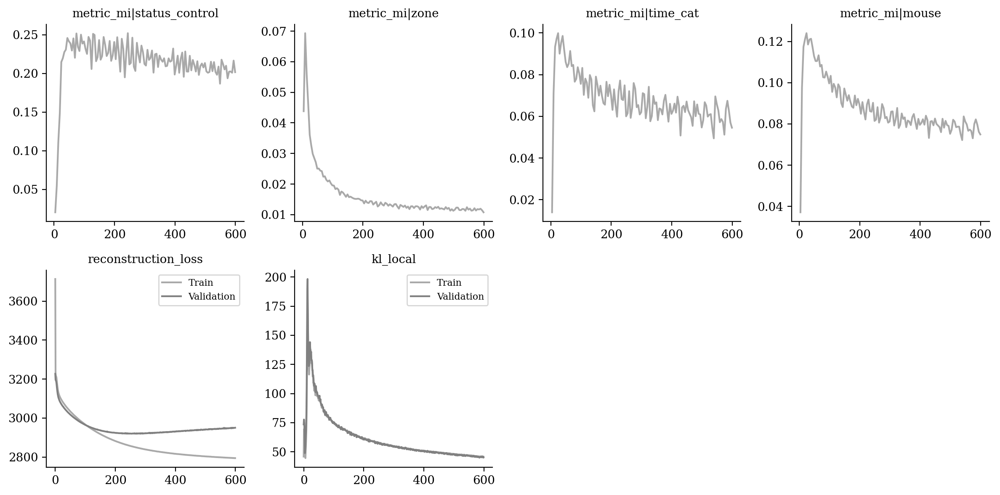

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

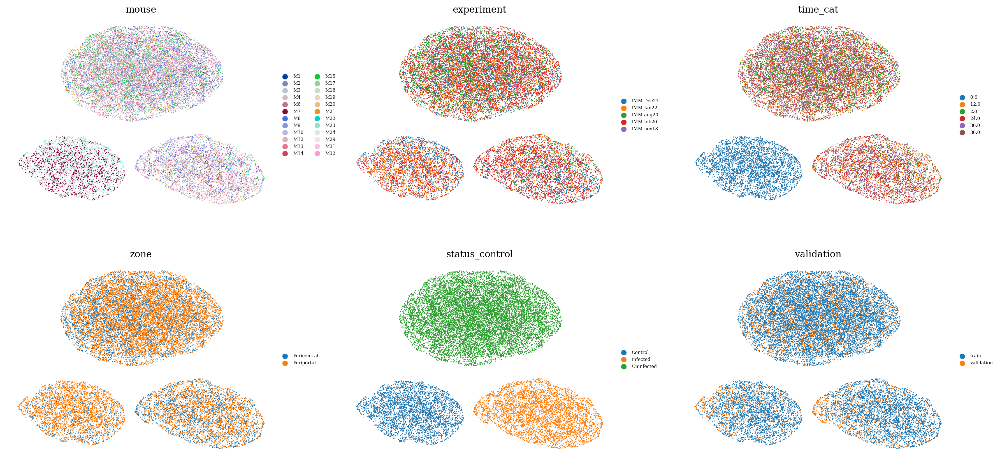

In [13]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

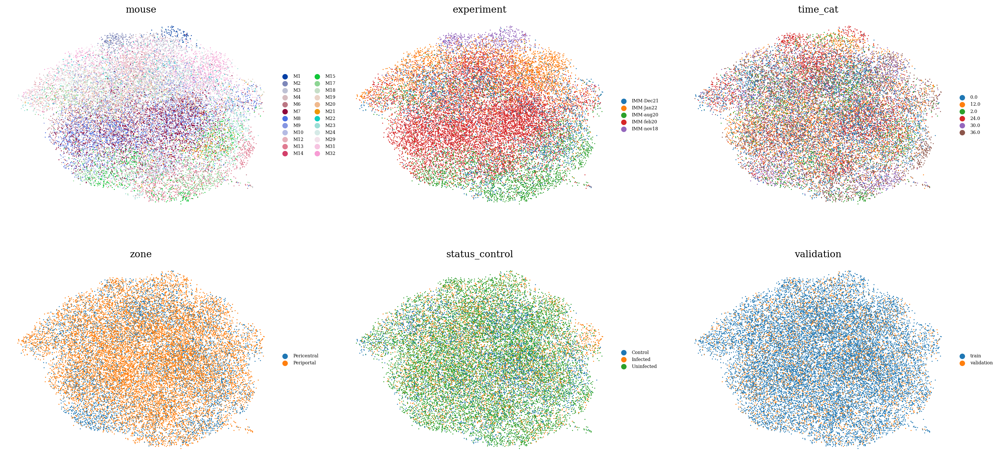

In [14]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )